In [1]:

import os
import torch
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
from PIL import Image
import numpy as np
import xml.etree.ElementTree as ET
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import matplotlib.patches as patches



# License Plate Recognition Neural Network
This notebook outlines the process for training, testing, and deploying a CNN model for the purpose of license plate recognition. The model will be trained to localize number plates in images.


In [2]:
# Configuration
import torch
import os

# Set the device for torch operations
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Path configurations
data_path = 'data/roboflow/'
model_path = 'models/'

# Hyperparameters
BATCH_SIZE = 250
EPOCHS = 500
LEARNING_RATE = 0.001
IMAGE_SIZE = (416, 416)

# General
TRAIN_IMG_RATIO = 0.9
DEMO_SHOW_IMGS = True
DEMO_SHOW_IMGC = 0

# Normalization parameters (to be computed from training data)
MEAN = None
STD = None


In [3]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torchvision import datasets
from torch.utils.data import DataLoader, TensorDataset


# General Utility Functions

In [4]:
# General Utility Functions

# Helper function to convert seconds to hours, minutes, seconds format
def seconds_to_hms(seconds):
    h, remainder = divmod(seconds, 3600)
    m, s = divmod(remainder, 60)
    return "{:02}:{:02}:{:02}".format(int(h), int(m), int(s))

def show_imgs(data):
    """
    Display multiple images with bounding boxes.
    
    Parameters:
    - data: A list of lists. Each inner list contains:
        [title, image, original_bbox, predicted_bbox]
    """
    
    num_imgs = len(data)
    fig, axes = plt.subplots(1, num_imgs, figsize=(15, 5 * num_imgs))

    print("Showing", num_imgs, "images...")
    
    # If there's only one image, axes won't be a list, so we wrap it in a list for consistency
    if num_imgs == 1:
        axes = [axes]
    
    for ax, (title, image, orig_bbox, pred_bbox) in zip(axes, data):
        # Handle torch.Tensor
        if isinstance(image, torch.Tensor):
            if image.is_cuda:
                image = image.cpu()  # Move tensor to CPU if it's on CUDA

            if image.dim() == 4:  # If a batch of images
                image = image[0]  # Take the first image

            img = image.detach().permute(1, 2, 0).numpy()  # permute to HWC layout
        # Handle PIL.Image
        elif isinstance(image, Image.Image):
            img = np.array(image)
        else:
            img = image.copy()

        # If the image values are between 0 and 1, scale them to [0, 255]
        # If the image values are between 0 and 1, scale them to [0, 255]
        if isinstance(img, np.ndarray) and img.max() <= 1.0:
            img = img * 255
            
        ax.imshow(img.astype(int), cmap='gray' if len(img.shape) == 2 or img.shape[2] == 1 else None)

        # Draw the original bounding box
        x, y, x1, y1 = orig_bbox
        if isinstance(orig_bbox, torch.Tensor):
            x, y, x1, y1 = orig_bbox.cpu().numpy()
        rect_orig = patches.Rectangle((x, y), x1 - x, y1 - y, linewidth=2, edgecolor='b', facecolor='none')
        ax.add_patch(rect_orig)

        # Draw the predicted bounding box
        if pred_bbox is not None:
            x, y, x1, y1 = pred_bbox
            if isinstance(pred_bbox, torch.Tensor):
                x, y, x1, y1 = pred_bbox.cpu().numpy()
            rect_pred = patches.Rectangle((x, y), x1 - x, y1 - y, linewidth=2, edgecolor='y', facecolor='none')
            ax.add_patch(rect_pred)

        ax.set_title(title)
    
    plt.tight_layout()
    plt.show()




# Image Preparation Functions

In [10]:
# Image Preparation Functions
import torch
from torchvision import transforms
import torchvision.transforms.functional as TF
from PIL import Image, ImageOps
import numpy as np

# Define the transform for preprocessing
preprocess_transform = transforms.Compose([
    transforms.Grayscale(), # Convert image to grayscale
    transforms.Resize((416, 416)), # Resize image to 416x416
    transforms.ToTensor(), # Convert image to PyTorch tensor
])

def read_image(file_path):
    '''Reads an image from file path and converts it to grayscale.'''
    img = Image.open(file_path).convert('L')
    return img

def process_image_to_tensor(image, mean=None, std=None):
    '''Resizes and normalizes image using the given mean and std.'''
    
    # Contrast increase
    img_enhanced = enhance_contrast(image)

    img_tensor = preprocess_transform(img_enhanced)
    
    img_tensor = min_max_scale_tensor(img_tensor)

    img_tensor = quantize_tensor(img_tensor, 5)

    # Normalise by mean and std if provided
    # if mean is not None and std is not None:
    #     img_tensor = TF.normalize(img_tensor, [mean], [std])

    return img_tensor

def enhance_contrast(image):
    return ImageOps.equalize(image)

# def tensor_from_path(image_path, mean=None, std=None):
    #     '''Prepares an image for the model input.'''
    #     img = read_image(image_path)
    #     img = enhance_contrast(img)  # Enhance contrast after reading the image
    #     img_tensor = resize_and_normalize_image(img, mean, std)
    #     return img_tensor

def quantize_tensor(tensor, levels=5):
    # Assuming the input tensor is already normalized to [0, 1]
    # If not, uncomment the following line:
    # tensor = (tensor - tensor.min()) / (tensor.max() - tensor.min())

    # Calculate the step size for each quantization level
    step = 1.0 / (levels - 1)
    
    # Quantize the tensor
    quantized_tensor = torch.round(tensor / step) * step
    
    # Clamp the values to ensure they are within [0, 1]
    quantized_tensor = torch.clamp(quantized_tensor, 0, 1)
    
    return quantized_tensor

def min_max_scale_tensor(img_tensor):
    min_val = img_tensor.min()
    max_val = img_tensor.max()
    scaled_tensor = (img_tensor - min_val) / (max_val - min_val)
    return scaled_tensor

def normalize_tensor(img_tensor, mean, std):
    # if mean is not None and std is not None:
    #     img_tensor = TF.normalize(img_tensor, [mean], [std])

    return img_tensor

def compute_mean_std(image_tensors_list):
    '''Computes mean and std for a list of image tensors.'''
    all_images_tensor = torch.stack(image_tensors_list)
    mean = all_images_tensor.mean()
    std = all_images_tensor.std()
    return mean.item(), std.item()

def resize_bbox(original_bbox, original_size, new_size=(416, 416)):
    scale_x = new_size[0] / original_size[0]
    scale_y = new_size[1] / original_size[1]
    xmin, ymin, xmax, ymax = original_bbox
    new_bbox = (xmin * scale_x, ymin * scale_y, xmax * scale_x, ymax * scale_y)
    return new_bbox


# Dataset Preparation

In [11]:
# Dataset Preparation

import os
import torch
from torchvision import datasets
from torch.utils.data import DataLoader
from PIL import Image
import numpy as np
from tqdm import tqdm
import xml.etree.ElementTree as ET

# Define the dataset class
class LPR_Dataset(torch.utils.data.Dataset):
    def __init__(self, data_path, transform=None):
        self.data_path = data_path
        self.transform = transform
        self.training_data = []
        self.testing_data = []
        self.mean = 0
        self.std = 0

        torch.cuda.empty_cache()
        print("(LPR_Dataset) Loading and creating dataset!")
        self.create_training_data()
        print(f"(LPR_Dataset) Finished creating dataset. M{self.mean:.4f} SD{self.std:.4f}")
        
        n_mean, n_std = compute_mean_std([data[0] for data in self.training_data])
        print(f"(LPR_Dataset) Normalised dataset: M{n_mean:.4f} SD{n_std:.4f}")
        
        torch.cuda.empty_cache()

    def create_training_data(self):
        images_path = os.path.join(self.data_path, 'images')
        annotations_path = os.path.join(self.data_path, 'annotations')
        all_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

        print("(LPR_Dataset) Shuffling file list")
        np.random.shuffle(all_files)

        multi_discards = 0

        # all_files = all_files[:500]
        
        # Prepare the image tensors and bounding boxes
        for i, filename in tqdm(enumerate(all_files), total=len(all_files)):
            image_path = os.path.join(images_path, filename)
            annotation_path = os.path.join(annotations_path, filename.replace('.jpg', '.xml'))


            bbox = self.extract_bounding_box(annotation_path)
            if bbox is None:
                # print(f"Multiple objects detected in annotation for {filename}, skipping.")
                multi_discards += 1
                continue

            # Read the image and annotation
            image = read_image(image_path)
            original_size = image.size
            resized_bbox = resize_bbox(bbox, original_size)
            
            # Preprocess the image
            image_tensor = process_image_to_tensor(image)
            
            # Split the data into training and testing
            if i < TRAIN_IMG_RATIO * len(all_files):
                self.training_data.append((image_tensor, resized_bbox))
            else:
                self.testing_data.append((image_tensor, resized_bbox))
        
        print("(LPR_Dataset) Discarded", multi_discards, "images with multiple annotations!")

        # Normalize the training dataset and convert to TensorDataset
        print("(LPR_Dataset) Normalising dataset!")
        self.normalize_training_dataset()
        
        # Normalize the testing dataset and convert to TensorDataset
        self.normalize_testing_dataset()
        
    def extract_bounding_box(self, annotation_path):
        root = ET.parse(annotation_path).getroot()
        objects = root.findall('object')
        
        # Check if there are multiple objects
        if len(objects) != 1:
            return None
        
        # Extract bounding box for the single object
        bndbox = objects[0].find('bndbox')
        xmin = int(bndbox.find('xmin').text)
        ymin = int(bndbox.find('ymin').text)
        xmax = int(bndbox.find('xmax').text)
        ymax = int(bndbox.find('ymax').text)

        return (xmin, ymin, xmax, ymax)  

    def normalize_training_dataset(self):
        self.mean, self.std = compute_mean_std([data[0] for data in self.training_data])
        training_tensors = [normalize_tensor(img_tensor, self.mean, self.std) for img_tensor, _ in self.training_data]
        training_bboxes = [bbox for _, bbox in self.training_data]
        self.training_data = TensorDataset(torch.stack(training_tensors), torch.tensor(training_bboxes))

    def normalize_testing_dataset(self):
        testing_tensors = [normalize_tensor(img_tensor, self.mean, self.std) for img_tensor, _ in self.testing_data]
        testing_bboxes = [bbox for _, bbox in self.testing_data]
        self.testing_data = TensorDataset(torch.stack(testing_tensors), torch.tensor(testing_bboxes))




# Model Definition

In [7]:
import torch.nn as nn
import torch.nn.functional as F

# Model Definition
class LPLocalNet(torch.nn.Module):
    def __init__(self):
        super(LPLocalNet, self).__init__()

        self.sobel = SobelEdgeDetection()

        # CNNs for grayscale images
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=6, kernel_size=5)
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=12, kernel_size=5)
        self.conv3 = nn.Conv2d(in_channels=12, out_channels=24, kernel_size=5)
        self.conv4 = nn.Conv2d(in_channels=24, out_channels=48, kernel_size=5)
        self.conv5 = nn.Conv2d(in_channels=48, out_channels=192, kernel_size=5)

        # Connecting CNN outputs with Fully Connected layers for bounding box
        self.box_fc1 = nn.Linear(in_features=12288, out_features=240)
        self.box_fc2 = nn.Linear(in_features=240, out_features=120)
        self.box_out = nn.Linear(in_features=120, out_features=4)

    def forward(self, t):
        global DEMO_SHOW_IMGS, DEMO_SHOW_IMGC

        # Only keep the magnitudes from the Canny filter
        t = self.sobel(t)

        if DEMO_SHOW_IMGS and DEMO_SHOW_IMGC < 5:
            show_imgs([["Sobel Model", t, [0,0,0,0], None]])
            # DEMO_SHOW_IMGS = False
            DEMO_SHOW_IMGC += 1

        t = self.conv1(t)
        t = F.relu(t)
        t = F.max_pool2d(t, kernel_size=2, stride=2)

        t = self.conv2(t)
        t = F.relu(t)
        t = F.max_pool2d(t, kernel_size=2, stride=2)

        t = self.conv3(t)
        t = F.relu(t)
        t = F.max_pool2d(t, kernel_size=2, stride=2)

        t = self.conv4(t)
        t = F.relu(t)
        t = F.max_pool2d(t, kernel_size=2, stride=2)

        t = self.conv5(t)
        t = F.relu(t)
        t = F.avg_pool2d(t, kernel_size=4, stride=2)

        t = torch.flatten(t, start_dim=1)

        box_t = self.box_fc1(t)
        box_t = F.relu(box_t)

        box_t = self.box_fc2(box_t)
        box_t = F.relu(box_t)

        box_t = self.box_out(box_t)
       

        return box_t

class SobelEdgeDetection(nn.Module):
    def __init__(self):
        super(SobelEdgeDetection, self).__init__()
        # Define Sobel operator kernels
        self.sobel_kernel_x = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=torch.float32).unsqueeze(0).unsqueeze(0)
        self.sobel_kernel_y = torch.tensor([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=torch.float32).unsqueeze(0).unsqueeze(0)
        if torch.cuda.is_available():
            self.sobel_kernel_x = self.sobel_kernel_x.cuda()
            self.sobel_kernel_y = self.sobel_kernel_y.cuda()

    def forward(self, x):
        # Convolve with Sobel kernels
        edge_x = F.conv2d(x, self.sobel_kernel_x, padding=1)
        edge_y = F.conv2d(x, self.sobel_kernel_y, padding=1)
        
        # Compute the magnitude of the gradients
        magnitude = torch.sqrt(edge_x**2 + edge_y**2)
        
        # Normalize the magnitude
        magnitude = (magnitude - magnitude.min()) / (magnitude.max() - magnitude.min())
        
        return magnitude



(LPR_Dataset) Loading and creating dataset!
(LPR_Dataset) Shuffling file list


100%|██████████| 8923/8923 [00:52<00:00, 170.92it/s]


(LPR_Dataset) Discarded 224 images with multiple annotations!
(LPR_Dataset) Normalising dataset!
(LPR_Dataset) Finished creating dataset. M0.4959 SD0.3057
(LPR_Dataset) Normalised dataset: M0.4959 SD0.3057
Showing 5 images...


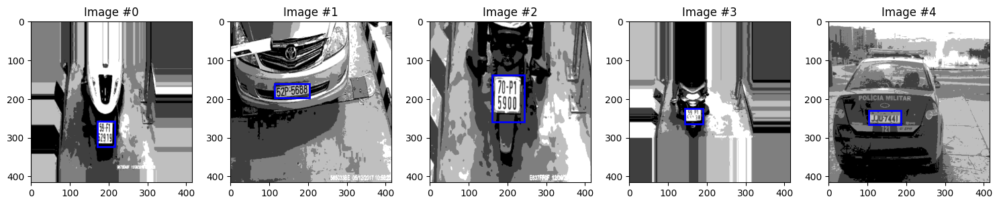

In [12]:
# Load dataset

dataset = None
# Prepare the data loader
if 'dataset' not in locals() or dataset is None:
    dataset = LPR_Dataset(data_path)

torch.cuda.empty_cache()
train_loader = DataLoader(dataset.training_data, batch_size=BATCH_SIZE, shuffle=True)


demo_arr = []
for i in range(5):
    demo_arr.append([
        "Image #{}".format(i),
        # Image.fromarray(
            dataset.training_data[i][0],
            # ),
        np.array(dataset.training_data[i][1]),
        None
    ])
show_imgs(demo_arr)



# Training Loop

Running LPLocalNet on cuda
The loss plot will start from Epoch #2 onwards, to enhance readability.
Waiting 2s before starting training...
Showing 5 images...


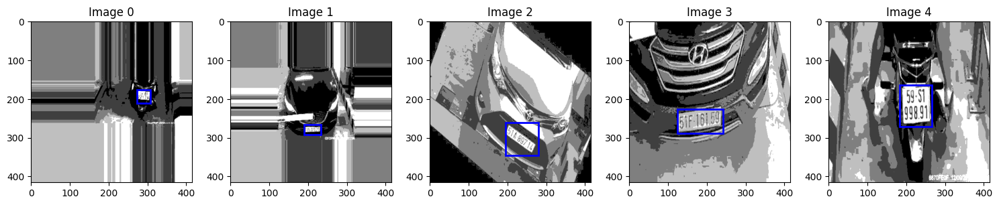

Epoch   0/500 - Loss: 20338.703 - Loss Diff: 0.000% - Loss Trend: 0.000 - Complete in: 03:35:20s
Epoch   1/500 - Loss: 3678.891 - Loss Diff: -81.912% - Loss Trend: -40.956 - Complete in: 03:29:53s
Epoch   2/500 - Loss: 2831.453 - Loss Diff: -23.035% - Loss Trend: -34.982 - Complete in: 03:27:21s
Epoch   3/500 - Loss: 2392.599 - Loss Diff: -15.499% - Loss Trend: -30.112 - Complete in: 03:26:02s
Epoch   4/500 - Loss: 2216.719 - Loss Diff: -7.351% - Loss Trend: -25.559 - Complete in: 03:24:59s
Epoch   5/500 - Loss: 2137.110 - Loss Diff: -3.591% - Loss Trend: -21.898 - Complete in: 03:24:13s
Epoch   6/500 - Loss: 2018.888 - Loss Diff: -5.532% - Loss Trend: -19.560 - Complete in: 03:23:41s
Epoch   7/500 - Loss: 1930.722 - Loss Diff: -4.367% - Loss Trend: -17.661 - Complete in: 03:23:35s
Epoch   8/500 - Loss: 1872.432 - Loss Diff: -3.019% - Loss Trend: -16.034 - Complete in: 03:23:00s
Epoch   9/500 - Loss: 1813.177 - Loss Diff: -3.165% - Loss Trend: -14.747 - Complete in: 03:22:19s
Showing 5

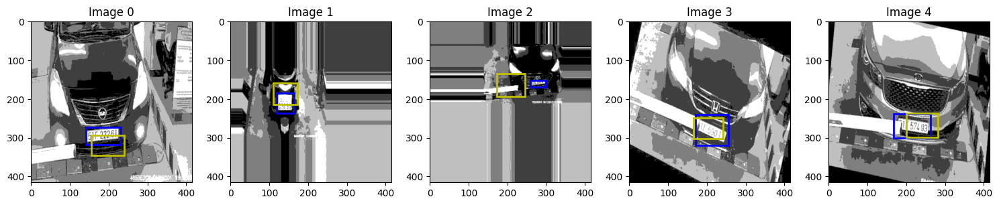

Epoch  10/500 - Loss: 1805.743 - Loss Diff: -0.410% - Loss Trend: -13.444 - Complete in: 03:24:29s
Epoch  11/500 - Loss: 1816.122 - Loss Diff: 0.575% - Loss Trend: -12.276 - Complete in: 03:22:39s
Epoch  12/500 - Loss: 1778.346 - Loss Diff: -2.080% - Loss Trend: -11.491 - Complete in: 03:21:43s
Epoch  13/500 - Loss: 1773.075 - Loss Diff: -0.296% - Loss Trend: -10.692 - Complete in: 03:20:53s
Epoch  14/500 - Loss: 1753.079 - Loss Diff: -1.128% - Loss Trend: -10.054 - Complete in: 03:20:17s
Epoch  15/500 - Loss: 1709.382 - Loss Diff: -2.493% - Loss Trend: -10.220 - Complete in: 03:19:48s
Epoch  16/500 - Loss: 1682.160 - Loss Diff: -1.593% - Loss Trend: -4.866 - Complete in: 03:19:47s
Epoch  17/500 - Loss: 1629.684 - Loss Diff: -3.120% - Loss Trend: -3.538 - Complete in: 03:19:41s
Epoch  18/500 - Loss: 1608.810 - Loss Diff: -1.281% - Loss Trend: -2.590 - Complete in: 03:19:05s
Epoch  19/500 - Loss: 1590.856 - Loss Diff: -1.116% - Loss Trend: -2.174 - Complete in: 03:18:31s
Showing 5 image

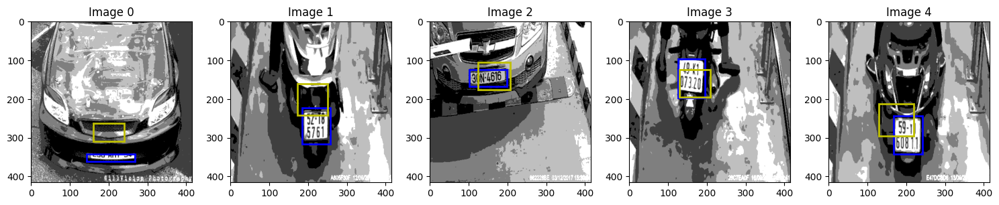

Epoch  20/500 - Loss: 1551.315 - Loss Diff: -2.486% - Loss Trend: -2.101 - Complete in: 03:20:23s
Epoch  21/500 - Loss: 1507.784 - Loss Diff: -2.806% - Loss Trend: -1.919 - Complete in: 03:18:47s
Epoch  22/500 - Loss: 1500.889 - Loss Diff: -0.457% - Loss Trend: -1.658 - Complete in: 03:17:48s
Epoch  23/500 - Loss: 1492.042 - Loss Diff: -0.589% - Loss Trend: -1.496 - Complete in: 03:17:02s
Epoch  24/500 - Loss: 1563.898 - Loss Diff: 4.816% - Loss Trend: -0.964 - Complete in: 03:16:28s
Epoch  25/500 - Loss: 1474.708 - Loss Diff: -5.703% - Loss Trend: -1.317 - Complete in: 03:16:06s
Epoch  26/500 - Loss: 1437.939 - Loss Diff: -2.493% - Loss Trend: -1.522 - Complete in: 03:15:33s
Epoch  27/500 - Loss: 1445.460 - Loss Diff: 0.523% - Loss Trend: -1.348 - Complete in: 03:15:12s
Epoch  28/500 - Loss: 1386.920 - Loss Diff: -4.050% - Loss Trend: -1.598 - Complete in: 03:14:40s
Epoch  29/500 - Loss: 1414.767 - Loss Diff: 2.008% - Loss Trend: -1.389 - Complete in: 03:14:29s
Showing 5 images...


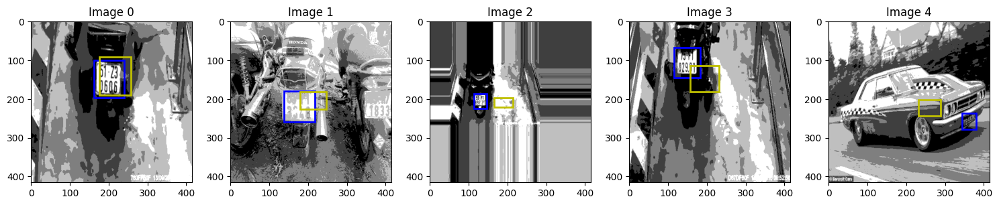

Epoch  30/500 - Loss: 1582.652 - Loss Diff: 11.867% - Loss Trend: -0.432 - Complete in: 03:15:53s
Epoch  31/500 - Loss: 1474.948 - Loss Diff: -6.805% - Loss Trend: -0.780 - Complete in: 03:14:33s
Epoch  32/500 - Loss: 1372.366 - Loss Diff: -6.955% - Loss Trend: -1.035 - Complete in: 03:13:39s
Epoch  33/500 - Loss: 1386.352 - Loss Diff: 1.019% - Loss Trend: -0.882 - Complete in: 03:12:45s
Epoch  34/500 - Loss: 1298.098 - Loss Diff: -6.366% - Loss Trend: -1.232 - Complete in: 03:12:19s
Epoch  35/500 - Loss: 1308.089 - Loss Diff: 0.770% - Loss Trend: -1.015 - Complete in: 03:11:54s
Epoch  36/500 - Loss: 1277.491 - Loss Diff: -2.339% - Loss Trend: -0.984 - Complete in: 03:11:29s
Epoch  37/500 - Loss: 1286.133 - Loss Diff: 0.676% - Loss Trend: -0.908 - Complete in: 03:10:57s
Epoch  38/500 - Loss: 1321.036 - Loss Diff: 2.714% - Loss Trend: -0.688 - Complete in: 03:10:43s
Epoch  39/500 - Loss: 1306.462 - Loss Diff: -1.103% - Loss Trend: -1.083 - Complete in: 03:10:05s
Showing 5 images...


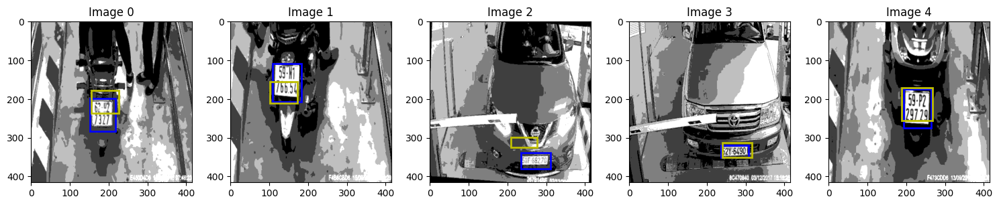

Epoch  40/500 - Loss: 1326.599 - Loss Diff: 1.541% - Loss Trend: -0.600 - Complete in: 03:11:48s
Epoch  41/500 - Loss: 1315.930 - Loss Diff: -0.804% - Loss Trend: -0.487 - Complete in: 03:10:22s
Epoch  42/500 - Loss: 1228.843 - Loss Diff: -6.618% - Loss Trend: -0.963 - Complete in: 03:09:21s
Epoch  43/500 - Loss: 1270.081 - Loss Diff: 3.356% - Loss Trend: -0.469 - Complete in: 03:08:34s
Epoch  44/500 - Loss: 1230.958 - Loss Diff: -3.080% - Loss Trend: -0.809 - Complete in: 03:08:27s
Epoch  45/500 - Loss: 1263.497 - Loss Diff: 2.643% - Loss Trend: -1.423 - Complete in: 03:07:32s
Epoch  46/500 - Loss: 1266.093 - Loss Diff: 0.205% - Loss Trend: -0.956 - Complete in: 03:07:04s
Epoch  47/500 - Loss: 1260.957 - Loss Diff: -0.406% - Loss Trend: -0.519 - Complete in: 03:06:59s
Epoch  48/500 - Loss: 1213.769 - Loss Diff: -3.742% - Loss Trend: -0.837 - Complete in: 03:06:36s
Epoch  49/500 - Loss: 1240.245 - Loss Diff: 2.181% - Loss Trend: -0.267 - Complete in: 03:06:07s
Showing 5 images...


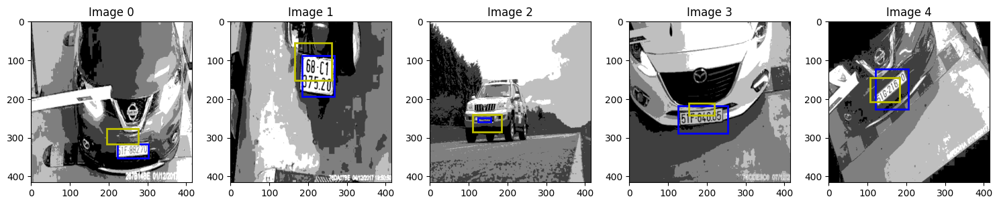

Epoch  50/500 - Loss: 1244.344 - Loss Diff: 0.330% - Loss Trend: -0.296 - Complete in: 03:07:59s
Epoch  51/500 - Loss: 1236.365 - Loss Diff: -0.641% - Loss Trend: -0.183 - Complete in: 03:06:37s
Epoch  52/500 - Loss: 1182.210 - Loss Diff: -4.380% - Loss Trend: -0.520 - Complete in: 03:05:31s
Epoch  53/500 - Loss: 1240.110 - Loss Diff: 4.898% - Loss Trend: -0.375 - Complete in: 03:04:49s
Epoch  54/500 - Loss: 1163.909 - Loss Diff: -6.145% - Loss Trend: -0.711 - Complete in: 03:04:15s
Epoch  55/500 - Loss: 1215.590 - Loss Diff: 4.440% - Loss Trend: -0.517 - Complete in: 03:03:43s
Epoch  56/500 - Loss: 1257.247 - Loss Diff: 3.427% - Loss Trend: -0.235 - Complete in: 03:03:20s
Epoch  57/500 - Loss: 1169.100 - Loss Diff: -7.011% - Loss Trend: -0.262 - Complete in: 03:02:50s
Epoch  58/500 - Loss: 1179.442 - Loss Diff: 0.885% - Loss Trend: -0.426 - Complete in: 03:02:25s
Epoch  59/500 - Loss: 1145.654 - Loss Diff: -2.865% - Loss Trend: -0.412 - Complete in: 03:02:03s
Showing 5 images...


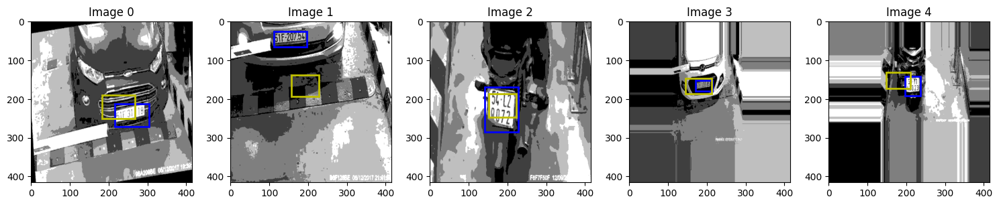

Epoch  60/500 - Loss: 1148.919 - Loss Diff: 0.285% - Loss Trend: -0.569 - Complete in: 03:03:37s
Epoch  61/500 - Loss: 1151.894 - Loss Diff: 0.259% - Loss Trend: -0.566 - Complete in: 03:02:12s
Epoch  62/500 - Loss: 1151.092 - Loss Diff: -0.070% - Loss Trend: -0.543 - Complete in: 03:01:16s
Epoch  63/500 - Loss: 1117.856 - Loss Diff: -2.887% - Loss Trend: -0.486 - Complete in: 03:00:22s
Epoch  64/500 - Loss: 1069.988 - Loss Diff: -4.282% - Loss Trend: -0.917 - Complete in: 02:59:46s
Epoch  65/500 - Loss: 1075.961 - Loss Diff: 0.558% - Loss Trend: -0.902 - Complete in: 02:59:26s
Epoch  66/500 - Loss: 1118.594 - Loss Diff: 3.962% - Loss Trend: -0.595 - Complete in: 02:59:06s
Epoch  67/500 - Loss: 1119.177 - Loss Diff: 0.052% - Loss Trend: -0.300 - Complete in: 02:58:39s
Epoch  68/500 - Loss: 1072.685 - Loss Diff: -4.154% - Loss Trend: -0.903 - Complete in: 02:58:26s
Epoch  69/500 - Loss: 1055.951 - Loss Diff: -1.560% - Loss Trend: -0.597 - Complete in: 02:57:53s
Showing 5 images...


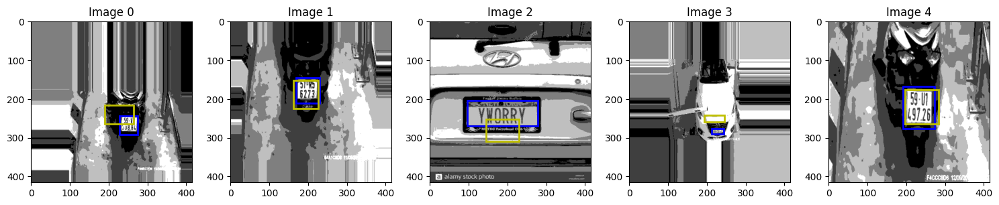

Epoch  70/500 - Loss: 1026.391 - Loss Diff: -2.799% - Loss Trend: -1.080 - Complete in: 02:59:42s
Epoch  71/500 - Loss: 1134.921 - Loss Diff: 10.574% - Loss Trend: -0.604 - Complete in: 02:58:10s
Epoch  72/500 - Loss: 1081.223 - Loss Diff: -4.731% - Loss Trend: -0.452 - Complete in: 02:57:01s
Epoch  73/500 - Loss: 1043.280 - Loss Diff: -3.509% - Loss Trend: -0.745 - Complete in: 02:56:18s
Epoch  74/500 - Loss: 1075.749 - Loss Diff: 3.112% - Loss Trend: -0.346 - Complete in: 02:55:48s
Epoch  75/500 - Loss: 1269.772 - Loss Diff: 18.036% - Loss Trend: 0.837 - Complete in: 02:55:15s
Epoch  76/500 - Loss: 1031.736 - Loss Diff: -18.746% - Loss Trend: -0.430 - Complete in: 02:54:42s
Epoch  77/500 - Loss: 1029.624 - Loss Diff: -0.205% - Loss Trend: -0.439 - Complete in: 02:54:23s
Epoch  78/500 - Loss: 1006.190 - Loss Diff: -2.276% - Loss Trend: -0.398 - Complete in: 02:53:58s
Epoch  79/500 - Loss: 1019.709 - Loss Diff: 1.344% - Loss Trend: -0.023 - Complete in: 02:53:45s
Showing 5 images...


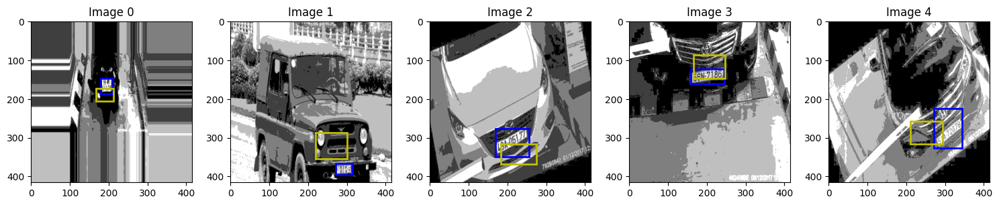

Epoch  80/500 - Loss: 1008.207 - Loss Diff: -1.128% - Loss Trend: -0.135 - Complete in: 02:55:03s
Epoch  81/500 - Loss: 1081.885 - Loss Diff: 7.308% - Loss Trend: 0.088 - Complete in: 02:53:30s
Epoch  82/500 - Loss: 1006.412 - Loss Diff: -6.976% - Loss Trend: -0.381 - Complete in: 02:52:48s
Epoch  83/500 - Loss: 1014.034 - Loss Diff: 0.757% - Loss Trend: -0.053 - Complete in: 02:52:13s
Epoch  84/500 - Loss: 987.403 - Loss Diff: -2.626% - Loss Trend: -0.124 - Complete in: 02:51:36s
Epoch  85/500 - Loss: 996.876 - Loss Diff: 0.959% - Loss Trend: 0.126 - Complete in: 02:51:14s
Epoch  86/500 - Loss: 986.915 - Loss Diff: -0.999% - Loss Trend: -0.645 - Complete in: 02:50:47s
Epoch  87/500 - Loss: 958.093 - Loss Diff: -2.920% - Loss Trend: -0.525 - Complete in: 02:50:17s
Epoch  88/500 - Loss: 974.270 - Loss Diff: 1.688% - Loss Trend: -0.178 - Complete in: 02:49:59s
Epoch  89/500 - Loss: 979.242 - Loss Diff: 0.510% - Loss Trend: -0.352 - Complete in: 02:49:38s
Showing 5 images...


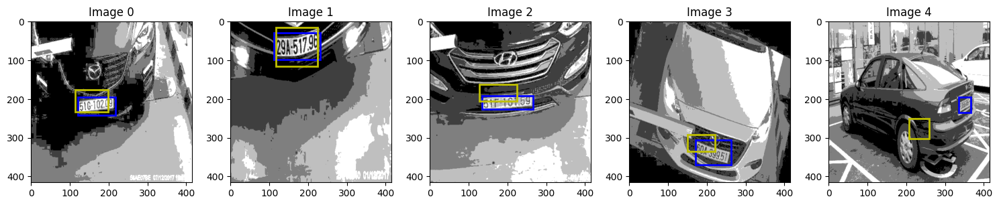

Epoch  90/500 - Loss: 950.513 - Loss Diff: -2.934% - Loss Trend: -1.750 - Complete in: 02:51:16s
Epoch  91/500 - Loss: 925.398 - Loss Diff: -2.642% - Loss Trend: -0.676 - Complete in: 02:49:43s
Epoch  92/500 - Loss: 887.997 - Loss Diff: -4.042% - Loss Trend: -0.932 - Complete in: 02:48:34s
Epoch  93/500 - Loss: 915.678 - Loss Diff: 3.117% - Loss Trend: -0.572 - Complete in: 02:47:59s
Epoch  94/500 - Loss: 886.753 - Loss Diff: -3.159% - Loss Trend: -0.872 - Complete in: 02:47:29s
Epoch  95/500 - Loss: 858.826 - Loss Diff: -3.149% - Loss Trend: -1.007 - Complete in: 02:47:04s
Epoch  96/500 - Loss: 896.642 - Loss Diff: 4.403% - Loss Trend: -1.201 - Complete in: 02:46:46s
Epoch  97/500 - Loss: 868.541 - Loss Diff: -3.134% - Loss Trend: -0.945 - Complete in: 02:46:24s
Epoch  98/500 - Loss: 869.448 - Loss Diff: 0.104% - Loss Trend: -0.988 - Complete in: 02:45:37s
Epoch  99/500 - Loss: 867.778 - Loss Diff: -0.192% - Loss Trend: -0.826 - Complete in: 02:45:07s
Showing 5 images...


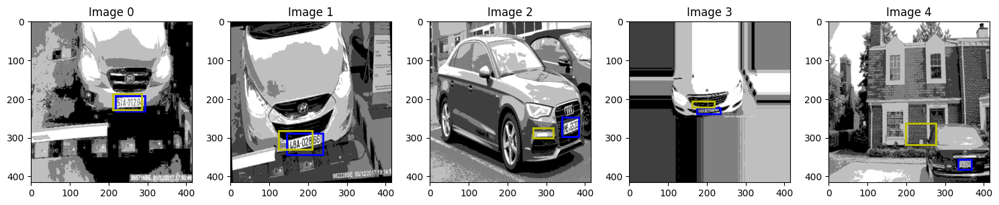

Epoch 100/500 - Loss: 811.110 - Loss Diff: -6.530% - Loss Trend: -1.325 - Complete in: 02:47:00s
Epoch 101/500 - Loss: 791.359 - Loss Diff: -2.435% - Loss Trend: -1.421 - Complete in: 02:45:27s
Epoch 102/500 - Loss: 821.974 - Loss Diff: 3.869% - Loss Trend: -0.968 - Complete in: 02:44:28s
Epoch 103/500 - Loss: 815.815 - Loss Diff: -0.749% - Loss Trend: -1.131 - Complete in: 02:44:01s
Epoch 104/500 - Loss: 802.390 - Loss Diff: -1.646% - Loss Trend: -1.275 - Complete in: 02:43:41s
Epoch 105/500 - Loss: 775.755 - Loss Diff: -3.319% - Loss Trend: -1.300 - Complete in: 02:43:11s
Epoch 106/500 - Loss: 817.754 - Loss Diff: 5.414% - Loss Trend: -0.763 - Complete in: 02:42:39s
Epoch 107/500 - Loss: 795.121 - Loss Diff: -2.768% - Loss Trend: -0.678 - Complete in: 02:42:14s
Epoch 108/500 - Loss: 760.858 - Loss Diff: -4.309% - Loss Trend: -1.173 - Complete in: 02:41:54s
Epoch 109/500 - Loss: 742.807 - Loss Diff: -2.372% - Loss Trend: -1.121 - Complete in: 02:41:15s
Showing 5 images...


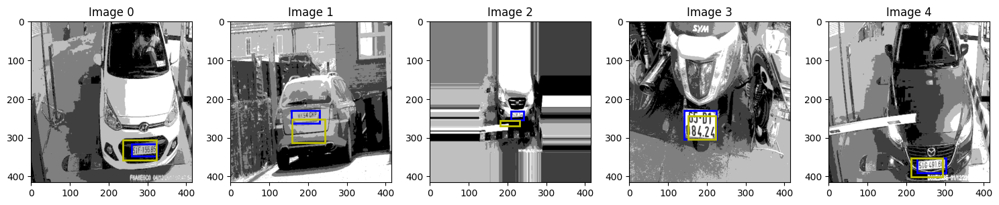

Epoch 110/500 - Loss: 755.048 - Loss Diff: 1.648% - Loss Trend: -0.801 - Complete in: 02:42:54s
Epoch 111/500 - Loss: 737.577 - Loss Diff: -2.314% - Loss Trend: -1.249 - Complete in: 02:41:39s
Epoch 112/500 - Loss: 717.130 - Loss Diff: -2.772% - Loss Trend: -1.225 - Complete in: 02:40:38s
Epoch 113/500 - Loss: 705.733 - Loss Diff: -1.589% - Loss Trend: -1.338 - Complete in: 02:40:01s
Epoch 114/500 - Loss: 710.284 - Loss Diff: 0.645% - Loss Trend: -1.282 - Complete in: 02:39:12s
Epoch 115/500 - Loss: 742.178 - Loss Diff: 4.490% - Loss Trend: -0.547 - Complete in: 02:38:40s
Epoch 116/500 - Loss: 675.391 - Loss Diff: -8.999% - Loss Trend: -0.985 - Complete in: 02:38:23s
Epoch 117/500 - Loss: 705.540 - Loss Diff: 4.464% - Loss Trend: -0.945 - Complete in: 02:37:55s
Epoch 118/500 - Loss: 676.458 - Loss Diff: -4.122% - Loss Trend: -1.170 - Complete in: 02:37:22s
Epoch 119/500 - Loss: 647.625 - Loss Diff: -4.262% - Loss Trend: -1.344 - Complete in: 02:37:03s
Showing 5 images...


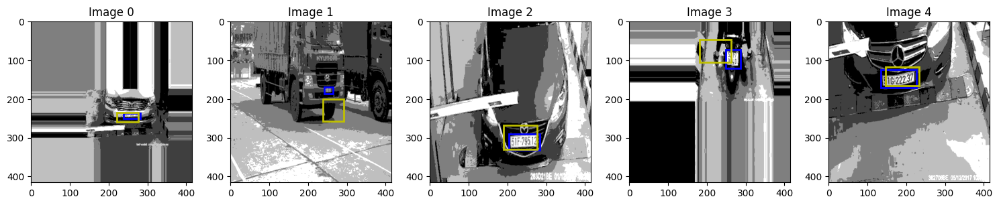

Epoch 120/500 - Loss: 684.454 - Loss Diff: 5.687% - Loss Trend: -0.744 - Complete in: 02:38:39s
Epoch 121/500 - Loss: 649.949 - Loss Diff: -5.041% - Loss Trend: -1.441 - Complete in: 02:37:00s
Epoch 122/500 - Loss: 669.566 - Loss Diff: 3.018% - Loss Trend: -1.055 - Complete in: 02:36:16s
Epoch 123/500 - Loss: 669.530 - Loss Diff: -0.005% - Loss Trend: -0.768 - Complete in: 02:35:38s
Epoch 124/500 - Loss: 662.902 - Loss Diff: -0.990% - Loss Trend: -0.676 - Complete in: 02:35:28s
Epoch 125/500 - Loss: 673.953 - Loss Diff: 1.667% - Loss Trend: -0.675 - Complete in: 02:34:45s
Epoch 126/500 - Loss: 672.085 - Loss Diff: -0.277% - Loss Trend: -0.539 - Complete in: 02:34:16s
Epoch 127/500 - Loss: 635.738 - Loss Diff: -5.408% - Loss Trend: -0.715 - Complete in: 02:34:12s
Epoch 128/500 - Loss: 596.499 - Loss Diff: -6.172% - Loss Trend: -1.020 - Complete in: 02:33:44s
Epoch 129/500 - Loss: 601.795 - Loss Diff: 0.888% - Loss Trend: -1.004 - Complete in: 02:33:10s
Showing 5 images...


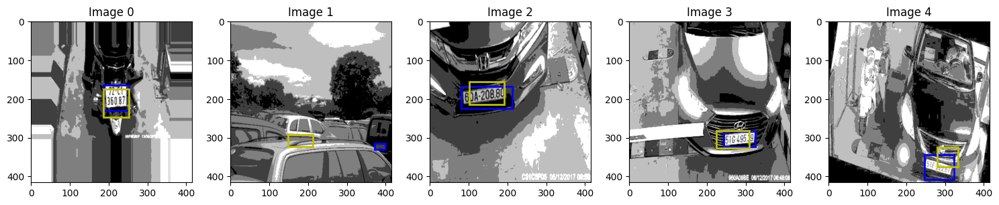

Epoch 130/500 - Loss: 614.926 - Loss Diff: 2.182% - Loss Trend: -1.158 - Complete in: 02:34:32s
Epoch 131/500 - Loss: 600.104 - Loss Diff: -2.410% - Loss Trend: -0.719 - Complete in: 02:33:13s
Epoch 132/500 - Loss: 587.323 - Loss Diff: -2.130% - Loss Trend: -1.158 - Complete in: 02:32:38s
Epoch 133/500 - Loss: 585.198 - Loss Diff: -0.362% - Loss Trend: -0.908 - Complete in: 02:31:51s
Epoch 134/500 - Loss: 599.210 - Loss Diff: 2.394% - Loss Trend: -0.464 - Complete in: 02:31:18s
Epoch 135/500 - Loss: 618.416 - Loss Diff: 3.205% - Loss Trend: -0.629 - Complete in: 02:30:33s
Epoch 136/500 - Loss: 578.472 - Loss Diff: -6.459% - Loss Trend: -0.724 - Complete in: 02:30:14s
Epoch 137/500 - Loss: 605.076 - Loss Diff: 4.599% - Loss Trend: -0.619 - Complete in: 02:29:51s
Epoch 138/500 - Loss: 577.462 - Loss Diff: -4.564% - Loss Trend: -0.922 - Complete in: 02:29:22s
Epoch 139/500 - Loss: 567.053 - Loss Diff: -1.803% - Loss Trend: -0.977 - Complete in: 02:29:17s
Showing 5 images...


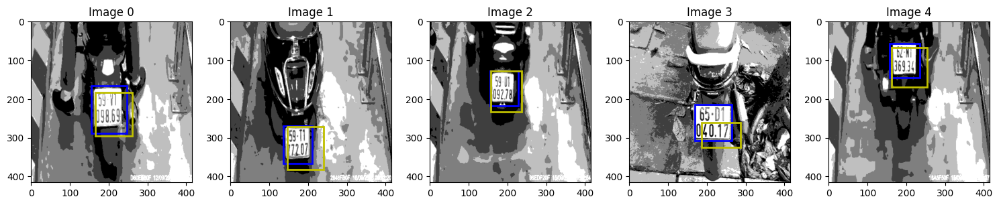

Epoch 140/500 - Loss: 588.768 - Loss Diff: 3.829% - Loss Trend: -0.832 - Complete in: 02:30:30s
Epoch 141/500 - Loss: 552.168 - Loss Diff: -6.216% - Loss Trend: -1.228 - Complete in: 02:29:00s
Epoch 142/500 - Loss: 549.664 - Loss Diff: -0.454% - Loss Trend: -0.898 - Complete in: 02:28:17s
Epoch 143/500 - Loss: 546.813 - Loss Diff: -0.519% - Loss Trend: -0.521 - Complete in: 02:27:23s
Epoch 144/500 - Loss: 539.983 - Loss Diff: -1.249% - Loss Trend: -0.664 - Complete in: 02:26:51s
Epoch 145/500 - Loss: 535.584 - Loss Diff: -0.815% - Loss Trend: -0.863 - Complete in: 02:26:31s
Epoch 146/500 - Loss: 535.267 - Loss Diff: -0.059% - Loss Trend: -0.707 - Complete in: 02:25:56s
Epoch 147/500 - Loss: 533.514 - Loss Diff: -0.328% - Loss Trend: -0.587 - Complete in: 02:25:25s
Epoch 148/500 - Loss: 513.562 - Loss Diff: -3.740% - Loss Trend: -0.812 - Complete in: 02:25:19s
Epoch 149/500 - Loss: 511.060 - Loss Diff: -0.487% - Loss Trend: -1.004 - Complete in: 02:24:58s
Showing 5 images...


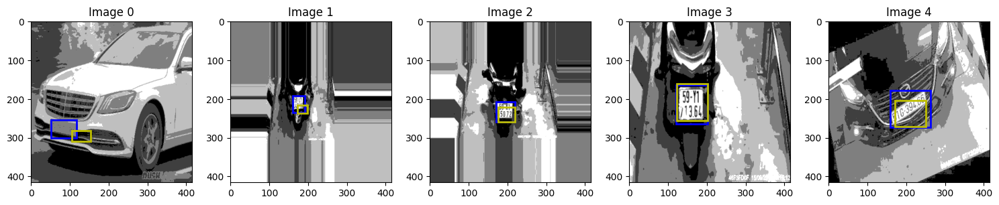

Epoch 150/500 - Loss: 520.205 - Loss Diff: 1.789% - Loss Trend: -1.098 - Complete in: 02:26:22s
Epoch 151/500 - Loss: 514.959 - Loss Diff: -1.008% - Loss Trend: -0.735 - Complete in: 02:24:58s
Epoch 152/500 - Loss: 492.826 - Loss Diff: -4.298% - Loss Trend: -1.328 - Complete in: 02:23:59s
Epoch 153/500 - Loss: 536.158 - Loss Diff: 8.793% - Loss Trend: -0.438 - Complete in: 02:23:45s
Epoch 154/500 - Loss: 522.944 - Loss Diff: -2.464% - Loss Trend: -0.482 - Complete in: 02:23:10s
Epoch 155/500 - Loss: 482.484 - Loss Diff: -7.737% - Loss Trend: -1.253 - Complete in: 02:22:38s
Epoch 156/500 - Loss: 475.057 - Loss Diff: -1.539% - Loss Trend: -0.941 - Complete in: 02:22:01s
Epoch 157/500 - Loss: 467.025 - Loss Diff: -1.691% - Loss Trend: -1.023 - Complete in: 02:21:39s
Epoch 158/500 - Loss: 487.547 - Loss Diff: 4.394% - Loss Trend: -0.696 - Complete in: 02:21:07s
Epoch 159/500 - Loss: 469.503 - Loss Diff: -3.701% - Loss Trend: -0.859 - Complete in: 02:20:48s
Showing 5 images...


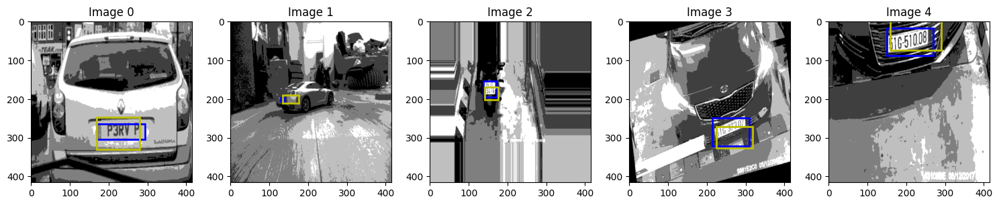

Epoch 160/500 - Loss: 484.269 - Loss Diff: 3.145% - Loss Trend: -0.595 - Complete in: 02:21:59s
Epoch 161/500 - Loss: 452.509 - Loss Diff: -6.558% - Loss Trend: -1.029 - Complete in: 02:20:45s
Epoch 162/500 - Loss: 478.598 - Loss Diff: 5.766% - Loss Trend: -0.623 - Complete in: 02:19:43s
Epoch 163/500 - Loss: 483.183 - Loss Diff: 0.958% - Loss Trend: -0.309 - Complete in: 02:19:00s
Epoch 164/500 - Loss: 467.797 - Loss Diff: -3.184% - Loss Trend: -0.489 - Complete in: 02:18:24s
Epoch 165/500 - Loss: 438.972 - Loss Diff: -6.162% - Loss Trend: -1.019 - Complete in: 02:18:08s
Epoch 166/500 - Loss: 490.158 - Loss Diff: 11.660% - Loss Trend: -0.175 - Complete in: 02:17:55s
Epoch 167/500 - Loss: 479.572 - Loss Diff: -2.160% - Loss Trend: -0.032 - Complete in: 02:17:34s
Epoch 168/500 - Loss: 433.783 - Loss Diff: -9.548% - Loss Trend: -1.255 - Complete in: 02:16:54s
Epoch 169/500 - Loss: 443.050 - Loss Diff: 2.136% - Loss Trend: -0.948 - Complete in: 02:16:35s
Showing 5 images...


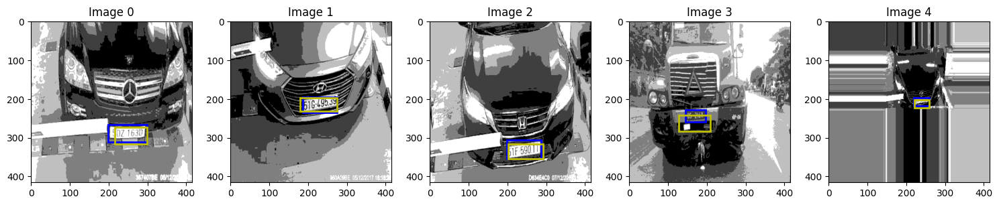

Epoch 170/500 - Loss: 458.037 - Loss Diff: 3.383% - Loss Trend: -0.207 - Complete in: 02:17:52s
Epoch 171/500 - Loss: 417.146 - Loss Diff: -8.927% - Loss Trend: -0.699 - Complete in: 02:16:42s
Epoch 172/500 - Loss: 421.853 - Loss Diff: 1.128% - Loss Trend: -0.511 - Complete in: 02:15:43s
Epoch 173/500 - Loss: 420.477 - Loss Diff: -0.326% - Loss Trend: -0.826 - Complete in: 02:15:04s
Epoch 174/500 - Loss: 500.015 - Loss Diff: 18.916% - Loss Trend: 0.682 - Complete in: 02:14:31s
Epoch 175/500 - Loss: 423.385 - Loss Diff: -15.326% - Loss Trend: -0.550 - Complete in: 02:14:02s
Epoch 176/500 - Loss: 400.046 - Loss Diff: -5.512% - Loss Trend: -0.480 - Complete in: 02:13:38s
Epoch 177/500 - Loss: 428.671 - Loss Diff: 7.155% - Loss Trend: -0.387 - Complete in: 02:13:20s
Epoch 178/500 - Loss: 400.776 - Loss Diff: -6.507% - Loss Trend: -0.885 - Complete in: 02:12:48s
Epoch 179/500 - Loss: 411.404 - Loss Diff: 2.652% - Loss Trend: -0.496 - Complete in: 02:12:27s
Showing 5 images...


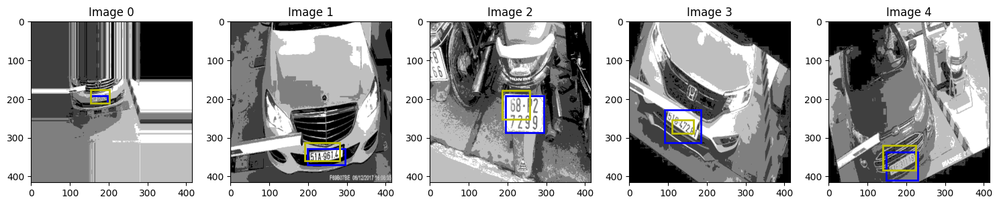

Epoch 180/500 - Loss: 418.098 - Loss Diff: 1.627% - Loss Trend: 0.023 - Complete in: 02:13:36s
Epoch 181/500 - Loss: 396.508 - Loss Diff: -5.164% - Loss Trend: -1.098 - Complete in: 02:12:07s
Epoch 182/500 - Loss: 373.441 - Loss Diff: -5.818% - Loss Trend: -1.342 - Complete in: 02:11:22s
Epoch 183/500 - Loss: 402.740 - Loss Diff: 7.846% - Loss Trend: -0.182 - Complete in: 02:10:48s
Epoch 184/500 - Loss: 370.534 - Loss Diff: -7.997% - Loss Trend: -0.858 - Complete in: 02:10:20s
Epoch 185/500 - Loss: 355.200 - Loss Diff: -4.138% - Loss Trend: -1.359 - Complete in: 02:09:50s
Epoch 186/500 - Loss: 362.428 - Loss Diff: 2.035% - Loss Trend: -0.629 - Complete in: 02:09:18s
Epoch 187/500 - Loss: 373.585 - Loss Diff: 3.079% - Loss Trend: -0.499 - Complete in: 02:09:04s
Epoch 188/500 - Loss: 360.401 - Loss Diff: -3.529% - Loss Trend: -0.712 - Complete in: 02:08:37s
Epoch 189/500 - Loss: 351.539 - Loss Diff: -2.459% - Loss Trend: -2.137 - Complete in: 02:08:04s
Showing 5 images...


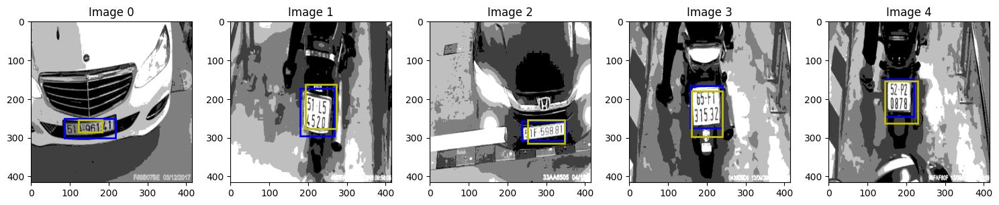

Epoch 190/500 - Loss: 359.659 - Loss Diff: 2.310% - Loss Trend: -0.961 - Complete in: 02:09:19s
Epoch 191/500 - Loss: 346.703 - Loss Diff: -3.602% - Loss Trend: -0.834 - Complete in: 02:07:58s
Epoch 192/500 - Loss: 365.260 - Loss Diff: 5.352% - Loss Trend: -0.954 - Complete in: 02:07:15s
Epoch 193/500 - Loss: 343.249 - Loss Diff: -6.026% - Loss Trend: -0.922 - Complete in: 02:06:34s
Epoch 194/500 - Loss: 339.132 - Loss Diff: -1.199% - Loss Trend: -1.179 - Complete in: 02:06:07s
Epoch 195/500 - Loss: 367.575 - Loss Diff: 8.387% - Loss Trend: -0.728 - Complete in: 02:05:45s
Epoch 196/500 - Loss: 324.069 - Loss Diff: -11.836% - Loss Trend: -1.173 - Complete in: 02:05:12s
Epoch 197/500 - Loss: 302.866 - Loss Diff: -6.542% - Loss Trend: -1.221 - Complete in: 02:04:39s
Epoch 198/500 - Loss: 326.470 - Loss Diff: 7.793% - Loss Trend: -1.225 - Complete in: 02:04:14s
Epoch 199/500 - Loss: 311.765 - Loss Diff: -4.504% - Loss Trend: -0.992 - Complete in: 02:03:49s
Showing 5 images...


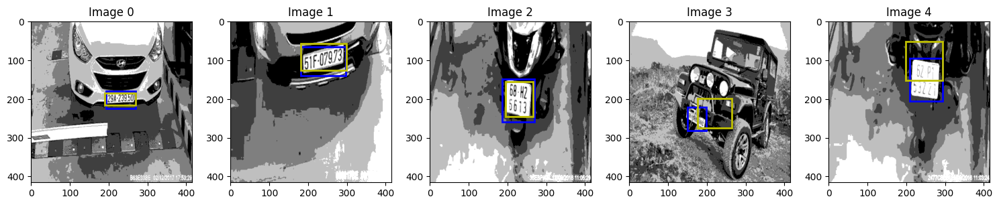

Epoch 200/500 - Loss: 322.773 - Loss Diff: 3.531% - Loss Trend: -0.481 - Complete in: 02:05:02s
Epoch 201/500 - Loss: 322.932 - Loss Diff: 0.049% - Loss Trend: -0.613 - Complete in: 02:03:57s
Epoch 202/500 - Loss: 367.484 - Loss Diff: 13.796% - Loss Trend: 0.101 - Complete in: 02:02:59s
Epoch 203/500 - Loss: 328.970 - Loss Diff: -10.480% - Loss Trend: -0.362 - Complete in: 02:02:24s
Epoch 204/500 - Loss: 306.275 - Loss Diff: -6.899% - Loss Trend: -0.658 - Complete in: 02:01:48s
Epoch 205/500 - Loss: 290.623 - Loss Diff: -5.110% - Loss Trend: -1.153 - Complete in: 02:01:27s
Epoch 206/500 - Loss: 289.071 - Loss Diff: -0.534% - Loss Trend: -0.948 - Complete in: 02:01:01s
Epoch 207/500 - Loss: 274.221 - Loss Diff: -5.137% - Loss Trend: -1.648 - Complete in: 02:00:50s
Epoch 208/500 - Loss: 285.810 - Loss Diff: 4.226% - Loss Trend: -0.964 - Complete in: 02:00:12s
Epoch 209/500 - Loss: 292.827 - Loss Diff: 2.455% - Loss Trend: -0.720 - Complete in: 01:59:42s
Showing 5 images...


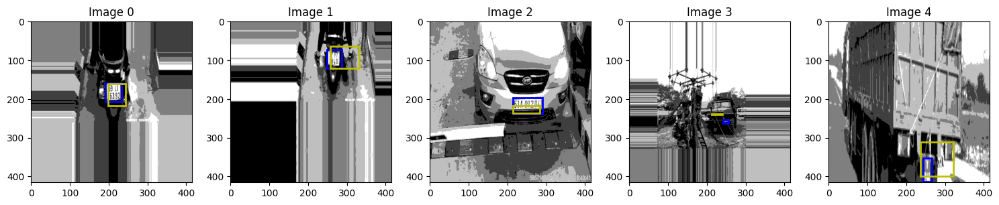

Epoch 210/500 - Loss: 281.343 - Loss Diff: -3.922% - Loss Trend: -1.541 - Complete in: 02:00:49s
Epoch 211/500 - Loss: 266.955 - Loss Diff: -5.114% - Loss Trend: -1.093 - Complete in: 01:59:31s
Epoch 212/500 - Loss: 276.457 - Loss Diff: 3.560% - Loss Trend: -0.419 - Complete in: 01:58:50s
Epoch 213/500 - Loss: 324.621 - Loss Diff: 17.422% - Loss Trend: 0.223 - Complete in: 01:58:23s
Epoch 214/500 - Loss: 260.198 - Loss Diff: -19.846% - Loss Trend: -0.800 - Complete in: 01:57:56s
Epoch 215/500 - Loss: 255.503 - Loss Diff: -1.804% - Loss Trend: -1.156 - Complete in: 01:57:27s
Epoch 216/500 - Loss: 244.478 - Loss Diff: -4.315% - Loss Trend: -1.447 - Complete in: 01:57:04s
Epoch 217/500 - Loss: 264.222 - Loss Diff: 8.076% - Loss Trend: -1.828 - Complete in: 01:56:50s
Epoch 218/500 - Loss: 244.236 - Loss Diff: -7.564% - Loss Trend: -1.634 - Complete in: 01:56:26s
Epoch 219/500 - Loss: 255.662 - Loss Diff: 4.678% - Loss Trend: -0.862 - Complete in: 01:56:01s
Showing 5 images...


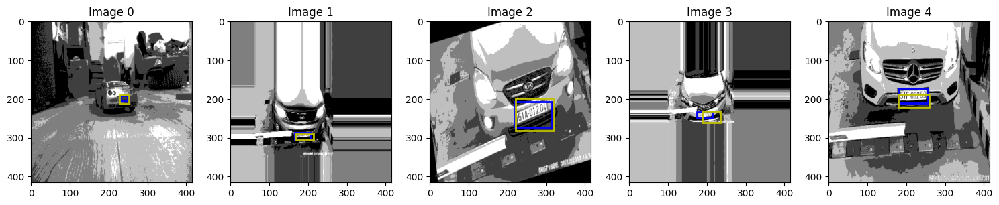

Epoch 220/500 - Loss: 286.819 - Loss Diff: 12.187% - Loss Trend: 0.291 - Complete in: 01:57:00s
Epoch 221/500 - Loss: 259.952 - Loss Diff: -9.367% - Loss Trend: -0.298 - Complete in: 01:55:49s
Epoch 222/500 - Loss: 267.035 - Loss Diff: 2.725% - Loss Trend: 0.226 - Complete in: 01:54:48s
Epoch 223/500 - Loss: 249.629 - Loss Diff: -6.518% - Loss Trend: -0.490 - Complete in: 01:54:14s
Epoch 224/500 - Loss: 223.868 - Loss Diff: -10.320% - Loss Trend: -1.342 - Complete in: 01:53:40s
Epoch 225/500 - Loss: 225.371 - Loss Diff: 0.672% - Loss Trend: -1.035 - Complete in: 01:53:22s
Epoch 226/500 - Loss: 237.705 - Loss Diff: 5.473% - Loss Trend: -0.330 - Complete in: 01:52:46s
Epoch 227/500 - Loss: 238.989 - Loss Diff: 0.540% - Loss Trend: -0.531 - Complete in: 01:52:20s
Epoch 228/500 - Loss: 220.522 - Loss Diff: -7.727% - Loss Trend: -2.207 - Complete in: 01:52:01s
Epoch 229/500 - Loss: 210.946 - Loss Diff: -4.343% - Loss Trend: -1.174 - Complete in: 01:51:35s
Showing 5 images...


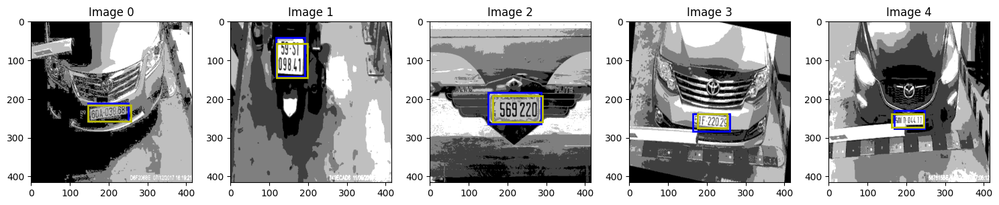

Epoch 230/500 - Loss: 228.305 - Loss Diff: 8.229% - Loss Trend: -0.505 - Complete in: 01:52:28s
Epoch 231/500 - Loss: 209.252 - Loss Diff: -8.345% - Loss Trend: -0.774 - Complete in: 01:51:34s
Epoch 232/500 - Loss: 204.466 - Loss Diff: -2.287% - Loss Trend: -1.465 - Complete in: 01:51:07s
Epoch 233/500 - Loss: 233.337 - Loss Diff: 14.121% - Loss Trend: -0.019 - Complete in: 01:50:28s
Epoch 234/500 - Loss: 201.117 - Loss Diff: -13.808% - Loss Trend: -1.251 - Complete in: 01:49:49s
Epoch 235/500 - Loss: 254.855 - Loss Diff: 26.720% - Loss Trend: -0.283 - Complete in: 01:49:25s
Epoch 236/500 - Loss: 193.183 - Loss Diff: -24.199% - Loss Trend: -1.271 - Complete in: 01:49:09s
Epoch 237/500 - Loss: 206.555 - Loss Diff: 6.922% - Loss Trend: -0.991 - Complete in: 01:48:26s
Epoch 238/500 - Loss: 199.071 - Loss Diff: -3.623% - Loss Trend: -0.798 - Complete in: 01:47:57s
Epoch 239/500 - Loss: 210.037 - Loss Diff: 5.509% - Loss Trend: 0.257 - Complete in: 01:47:29s
Showing 5 images...


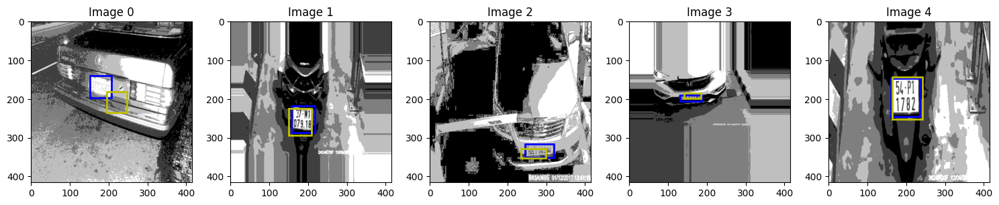

Epoch 240/500 - Loss: 178.212 - Loss Diff: -15.152% - Loss Trend: -0.798 - Complete in: 01:48:10s
Epoch 241/500 - Loss: 180.853 - Loss Diff: 1.482% - Loss Trend: -1.064 - Complete in: 01:47:14s
Epoch 242/500 - Loss: 183.327 - Loss Diff: 1.368% - Loss Trend: -1.009 - Complete in: 01:46:34s
Epoch 243/500 - Loss: 214.794 - Loss Diff: 17.164% - Loss Trend: 0.650 - Complete in: 01:46:07s
Epoch 244/500 - Loss: 194.083 - Loss Diff: -9.642% - Loss Trend: 0.297 - Complete in: 01:45:36s
Epoch 245/500 - Loss: 169.629 - Loss Diff: -12.600% - Loss Trend: -1.091 - Complete in: 01:45:03s
Epoch 246/500 - Loss: 173.580 - Loss Diff: 2.329% - Loss Trend: -0.380 - Complete in: 01:44:32s
Epoch 247/500 - Loss: 188.779 - Loss Diff: 8.756% - Loss Trend: 0.356 - Complete in: 01:44:05s
Epoch 248/500 - Loss: 178.594 - Loss Diff: -5.395% - Loss Trend: -0.945 - Complete in: 01:43:35s
Epoch 249/500 - Loss: 160.709 - Loss Diff: -10.015% - Loss Trend: -0.692 - Complete in: 01:43:19s
Showing 5 images...


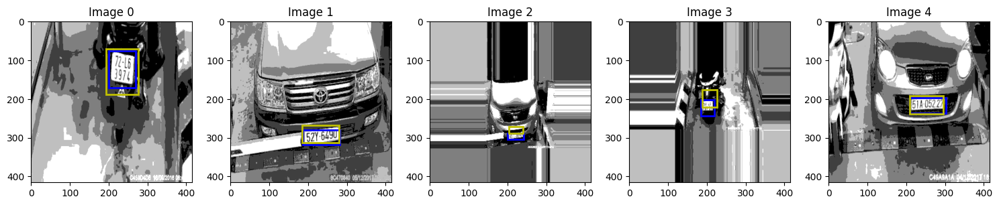

Epoch 250/500 - Loss: 161.794 - Loss Diff: 0.675% - Loss Trend: -2.428 - Complete in: 01:44:09s
Epoch 251/500 - Loss: 162.738 - Loss Diff: 0.584% - Loss Trend: -0.776 - Complete in: 01:43:10s
Epoch 252/500 - Loss: 159.716 - Loss Diff: -1.858% - Loss Trend: -1.361 - Complete in: 01:42:25s
Epoch 253/500 - Loss: 152.961 - Loss Diff: -4.229% - Loss Trend: -1.402 - Complete in: 01:41:39s
Epoch 254/500 - Loss: 156.428 - Loss Diff: 2.267% - Loss Trend: -1.618 - Complete in: 01:41:18s
Epoch 255/500 - Loss: 146.986 - Loss Diff: -6.036% - Loss Trend: -1.010 - Complete in: 01:40:48s
Epoch 256/500 - Loss: 147.585 - Loss Diff: 0.408% - Loss Trend: -1.082 - Complete in: 01:40:26s
Epoch 257/500 - Loss: 154.575 - Loss Diff: 4.736% - Loss Trend: -0.857 - Complete in: 01:40:02s
Epoch 258/500 - Loss: 140.431 - Loss Diff: -9.150% - Loss Trend: -2.611 - Complete in: 01:39:28s
Epoch 259/500 - Loss: 133.458 - Loss Diff: -4.965% - Loss Trend: -2.300 - Complete in: 01:39:02s
Showing 5 images...


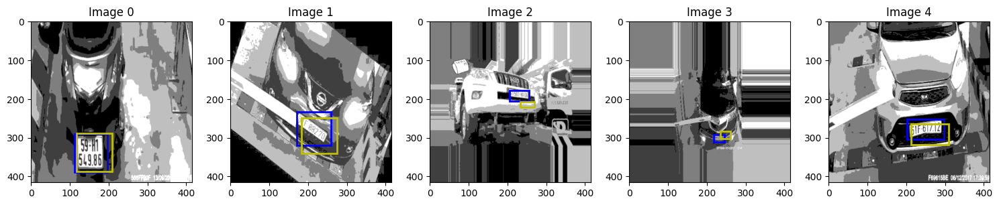

Epoch 260/500 - Loss: 206.643 - Loss Diff: 54.838% - Loss Trend: 2.196 - Complete in: 01:39:46s
Epoch 261/500 - Loss: 181.755 - Loss Diff: -12.044% - Loss Trend: 1.238 - Complete in: 01:38:48s
Epoch 262/500 - Loss: 141.453 - Loss Diff: -22.174% - Loss Trend: -0.824 - Complete in: 01:38:22s
Epoch 263/500 - Loss: 133.217 - Loss Diff: -5.822% - Loss Trend: -0.852 - Complete in: 01:37:39s
Epoch 264/500 - Loss: 126.606 - Loss Diff: -4.962% - Loss Trend: -0.516 - Complete in: 01:37:07s
Epoch 265/500 - Loss: 139.881 - Loss Diff: 10.485% - Loss Trend: 0.138 - Complete in: 01:36:39s
Epoch 266/500 - Loss: 144.693 - Loss Diff: 3.440% - Loss Trend: 0.329 - Complete in: 01:36:16s
Epoch 267/500 - Loss: 135.527 - Loss Diff: -6.335% - Loss Trend: 0.030 - Complete in: 01:35:48s
Epoch 268/500 - Loss: 133.362 - Loss Diff: -1.598% - Loss Trend: 0.206 - Complete in: 01:35:23s
Epoch 269/500 - Loss: 136.951 - Loss Diff: 2.691% - Loss Trend: 0.234 - Complete in: 01:35:05s
Showing 5 images...


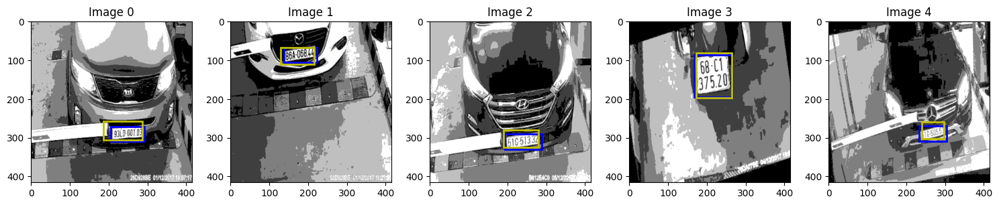

Epoch 270/500 - Loss: 138.464 - Loss Diff: 1.105% - Loss Trend: 0.710 - Complete in: 01:35:58s
Epoch 271/500 - Loss: 128.249 - Loss Diff: -7.377% - Loss Trend: 0.191 - Complete in: 01:34:58s
Epoch 272/500 - Loss: 123.026 - Loss Diff: -4.072% - Loss Trend: -0.396 - Complete in: 01:34:13s
Epoch 273/500 - Loss: 121.436 - Loss Diff: -1.292% - Loss Trend: 0.128 - Complete in: 01:33:36s
Epoch 274/500 - Loss: 116.337 - Loss Diff: -4.200% - Loss Trend: 0.179 - Complete in: 01:33:02s
Epoch 275/500 - Loss: 110.512 - Loss Diff: -5.007% - Loss Trend: -3.811 - Complete in: 01:32:36s
Epoch 276/500 - Loss: 110.819 - Loss Diff: 0.278% - Loss Trend: -2.989 - Complete in: 01:32:17s
Epoch 277/500 - Loss: 105.712 - Loss Diff: -4.608% - Loss Trend: -1.818 - Complete in: 01:31:49s
Epoch 278/500 - Loss: 122.307 - Loss Diff: 15.698% - Loss Trend: -0.384 - Complete in: 01:31:22s
Epoch 279/500 - Loss: 104.436 - Loss Diff: -14.611% - Loss Trend: -1.027 - Complete in: 01:30:53s
Showing 5 images...


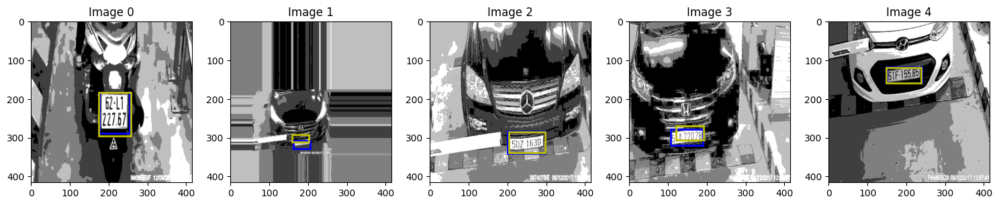

Epoch 280/500 - Loss: 106.918 - Loss Diff: 2.376% - Loss Trend: -1.567 - Complete in: 01:31:30s
Epoch 281/500 - Loss: 107.042 - Loss Diff: 0.116% - Loss Trend: -1.789 - Complete in: 01:30:29s
Epoch 282/500 - Loss: 101.175 - Loss Diff: -5.481% - Loss Trend: -1.732 - Complete in: 01:29:50s
Epoch 283/500 - Loss: 116.741 - Loss Diff: 15.386% - Loss Trend: -0.600 - Complete in: 01:29:13s
Epoch 284/500 - Loss: 111.125 - Loss Diff: -4.810% - Loss Trend: -1.100 - Complete in: 01:28:48s
Epoch 285/500 - Loss: 109.406 - Loss Diff: -1.547% - Loss Trend: -1.277 - Complete in: 01:28:29s
Epoch 286/500 - Loss: 113.164 - Loss Diff: 3.435% - Loss Trend: -0.556 - Complete in: 01:27:59s
Epoch 287/500 - Loss: 105.059 - Loss Diff: -7.163% - Loss Trend: -0.762 - Complete in: 01:27:40s
Epoch 288/500 - Loss: 102.857 - Loss Diff: -2.096% - Loss Trend: -0.816 - Complete in: 01:27:06s
Epoch 289/500 - Loss: 108.777 - Loss Diff: 5.755% - Loss Trend: -0.152 - Complete in: 01:26:41s
Showing 5 images...


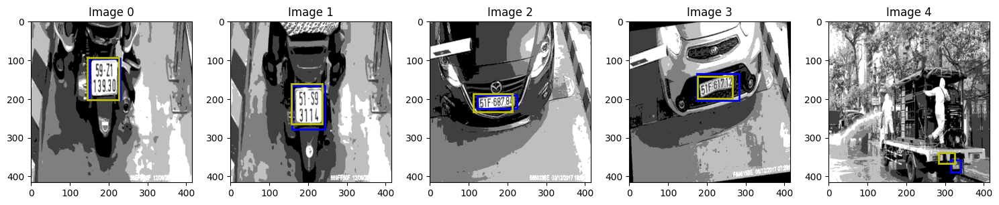

Epoch 290/500 - Loss: 105.096 - Loss Diff: -3.383% - Loss Trend: -0.044 - Complete in: 01:27:10s
Epoch 291/500 - Loss: 117.743 - Loss Diff: 12.034% - Loss Trend: 0.740 - Complete in: 01:26:18s
Epoch 292/500 - Loss: 123.469 - Loss Diff: 4.863% - Loss Trend: 1.371 - Complete in: 01:25:40s
Epoch 293/500 - Loss: 99.980 - Loss Diff: -19.024% - Loss Trend: -0.943 - Complete in: 01:25:15s
Epoch 294/500 - Loss: 110.972 - Loss Diff: 10.994% - Loss Trend: 0.764 - Complete in: 01:24:41s
Epoch 295/500 - Loss: 104.852 - Loss Diff: -5.515% - Loss Trend: 0.238 - Complete in: 01:24:13s
Epoch 296/500 - Loss: 103.196 - Loss Diff: -1.580% - Loss Trend: 0.125 - Complete in: 01:23:51s
Epoch 297/500 - Loss: 97.104 - Loss Diff: -5.904% - Loss Trend: 0.096 - Complete in: 01:23:18s
Epoch 298/500 - Loss: 104.629 - Loss Diff: 7.750% - Loss Trend: -0.413 - Complete in: 01:22:54s
Epoch 299/500 - Loss: 84.055 - Loss Diff: -19.664% - Loss Trend: -1.403 - Complete in: 01:22:26s
Showing 5 images...


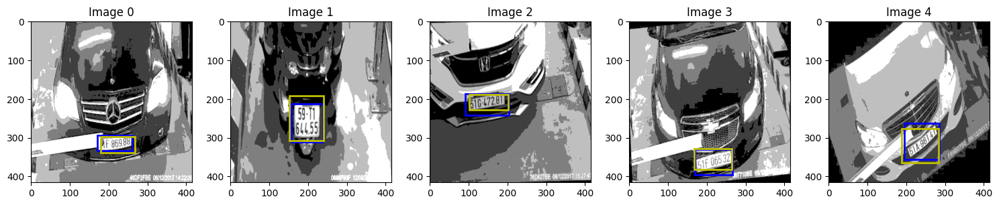

Epoch 300/500 - Loss: 94.236 - Loss Diff: 12.112% - Loss Trend: -0.492 - Complete in: 01:22:57s
Epoch 301/500 - Loss: 102.300 - Loss Diff: 8.558% - Loss Trend: -0.151 - Complete in: 01:22:07s
Epoch 302/500 - Loss: 97.886 - Loss Diff: -4.315% - Loss Trend: 0.039 - Complete in: 01:21:28s
Epoch 303/500 - Loss: 90.315 - Loss Diff: -7.735% - Loss Trend: -0.337 - Complete in: 01:20:57s
Epoch 304/500 - Loss: 95.232 - Loss Diff: 5.444% - Loss Trend: -0.358 - Complete in: 01:20:33s
Epoch 305/500 - Loss: 84.590 - Loss Diff: -11.174% - Loss Trend: -0.877 - Complete in: 01:20:02s
Epoch 306/500 - Loss: 85.436 - Loss Diff: 1.000% - Loss Trend: -1.613 - Complete in: 01:19:35s
Epoch 307/500 - Loss: 96.200 - Loss Diff: 12.599% - Loss Trend: -1.097 - Complete in: 01:19:12s
Epoch 308/500 - Loss: 81.756 - Loss Diff: -15.014% - Loss Trend: -0.830 - Complete in: 01:18:46s
Epoch 309/500 - Loss: 103.518 - Loss Diff: 26.618% - Loss Trend: 0.212 - Complete in: 01:18:25s
Showing 5 images...


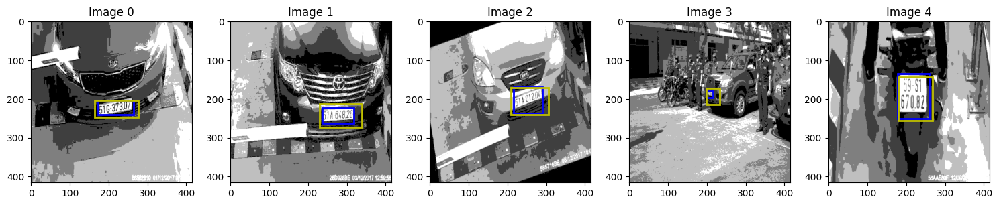

Epoch 310/500 - Loss: 101.235 - Loss Diff: -2.205% - Loss Trend: 0.433 - Complete in: 01:19:10s
Epoch 311/500 - Loss: 82.552 - Loss Diff: -18.455% - Loss Trend: -0.692 - Complete in: 01:18:16s
Epoch 312/500 - Loss: 83.211 - Loss Diff: 0.797% - Loss Trend: -0.246 - Complete in: 01:17:33s
Epoch 313/500 - Loss: 83.855 - Loss Diff: 0.774% - Loss Trend: -0.711 - Complete in: 01:17:06s
Epoch 314/500 - Loss: 103.579 - Loss Diff: 23.522% - Loss Trend: 2.168 - Complete in: 01:16:31s
Epoch 315/500 - Loss: 80.162 - Loss Diff: -22.608% - Loss Trend: -0.146 - Complete in: 01:16:06s
Epoch 316/500 - Loss: 78.792 - Loss Diff: -1.709% - Loss Trend: -0.831 - Complete in: 01:15:35s
Epoch 317/500 - Loss: 86.895 - Loss Diff: 10.284% - Loss Trend: 0.142 - Complete in: 01:15:11s
Epoch 318/500 - Loss: 92.515 - Loss Diff: 6.468% - Loss Trend: 1.089 - Complete in: 01:14:41s
Epoch 319/500 - Loss: 72.591 - Loss Diff: -21.536% - Loss Trend: -0.709 - Complete in: 01:14:24s
Showing 5 images...


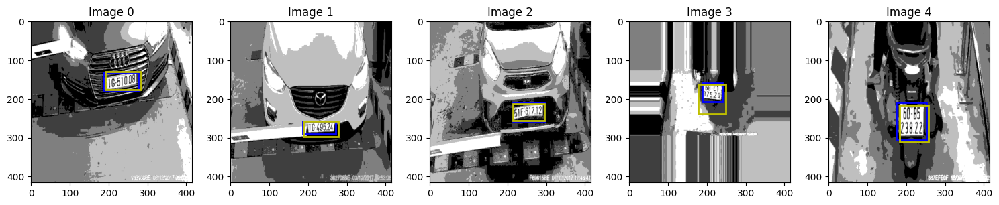

Epoch 320/500 - Loss: 77.132 - Loss Diff: 6.256% - Loss Trend: 0.453 - Complete in: 01:14:43s
Epoch 321/500 - Loss: 74.335 - Loss Diff: -3.626% - Loss Trend: 0.144 - Complete in: 01:13:53s
Epoch 322/500 - Loss: 78.346 - Loss Diff: 5.396% - Loss Trend: -0.336 - Complete in: 01:13:19s
Epoch 323/500 - Loss: 84.620 - Loss Diff: 8.008% - Loss Trend: 1.199 - Complete in: 01:12:38s
Epoch 324/500 - Loss: 85.827 - Loss Diff: 1.426% - Loss Trend: -0.481 - Complete in: 01:12:11s
Epoch 325/500 - Loss: 73.826 - Loss Diff: -13.982% - Loss Trend: -1.266 - Complete in: 01:11:50s
Epoch 326/500 - Loss: 71.062 - Loss Diff: -3.744% - Loss Trend: -0.285 - Complete in: 01:11:28s
Epoch 327/500 - Loss: 67.765 - Loss Diff: -4.640% - Loss Trend: -0.648 - Complete in: 01:11:01s
Epoch 328/500 - Loss: 97.986 - Loss Diff: 44.597% - Loss Trend: 2.274 - Complete in: 01:10:39s
Epoch 329/500 - Loss: 90.993 - Loss Diff: -7.136% - Loss Trend: 0.230 - Complete in: 01:10:08s
Showing 5 images...


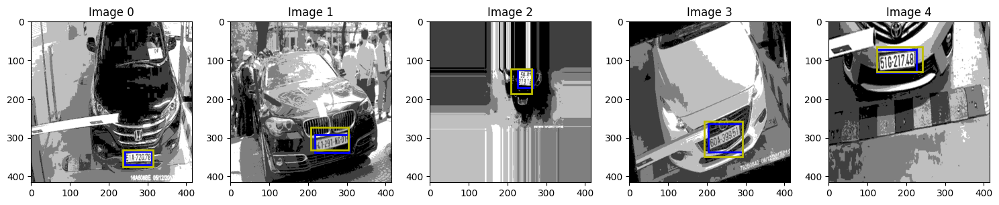

Epoch 330/500 - Loss: 65.184 - Loss Diff: -28.365% - Loss Trend: -0.154 - Complete in: 01:10:35s
Epoch 331/500 - Loss: 67.299 - Loss Diff: 3.245% - Loss Trend: 0.177 - Complete in: 01:09:48s
Epoch 332/500 - Loss: 69.361 - Loss Diff: 3.065% - Loss Trend: -0.305 - Complete in: 01:09:12s
Epoch 333/500 - Loss: 88.075 - Loss Diff: 26.979% - Loss Trend: 1.063 - Complete in: 01:08:41s
Epoch 334/500 - Loss: 88.416 - Loss Diff: 0.387% - Loss Trend: 2.524 - Complete in: 01:08:13s
Epoch 335/500 - Loss: 72.845 - Loss Diff: -17.611% - Loss Trend: 0.933 - Complete in: 01:07:44s
Epoch 336/500 - Loss: 64.557 - Loss Diff: -11.378% - Loss Trend: 0.416 - Complete in: 01:07:24s
Epoch 337/500 - Loss: 62.942 - Loss Diff: -2.502% - Loss Trend: -0.110 - Complete in: 01:07:07s
Epoch 338/500 - Loss: 66.275 - Loss Diff: 5.296% - Loss Trend: -0.291 - Complete in: 01:06:42s
Epoch 339/500 - Loss: 69.027 - Loss Diff: 4.152% - Loss Trend: -0.109 - Complete in: 01:06:16s
Showing 5 images...


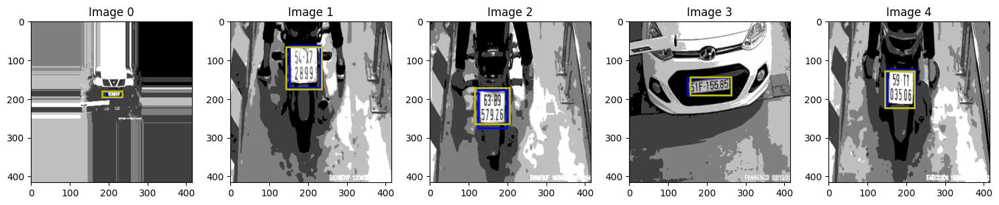

Epoch 340/500 - Loss: 125.223 - Loss Diff: 81.413% - Loss Trend: 6.251 - Complete in: 01:06:29s
Epoch 341/500 - Loss: 201.101 - Loss Diff: 60.594% - Loss Trend: 10.540 - Complete in: 01:05:38s
Epoch 342/500 - Loss: 70.609 - Loss Diff: -64.889% - Loss Trend: 6.523 - Complete in: 01:05:03s
Epoch 343/500 - Loss: 59.725 - Loss Diff: -15.415% - Loss Trend: 2.522 - Complete in: 01:04:33s
Epoch 344/500 - Loss: 59.745 - Loss Diff: 0.034% - Loss Trend: 3.000 - Complete in: 01:04:03s
Epoch 345/500 - Loss: 60.267 - Loss Diff: 0.873% - Loss Trend: 4.950 - Complete in: 01:03:31s
Epoch 346/500 - Loss: 55.106 - Loss Diff: -8.562% - Loss Trend: 4.162 - Complete in: 01:03:08s
Epoch 347/500 - Loss: 56.682 - Loss Diff: 2.859% - Loss Trend: 4.149 - Complete in: 01:02:43s
Epoch 348/500 - Loss: 57.556 - Loss Diff: 1.542% - Loss Trend: 2.453 - Complete in: 01:02:20s
Epoch 349/500 - Loss: 57.532 - Loss Diff: -0.041% - Loss Trend: 2.424 - Complete in: 01:01:51s
Showing 5 images...


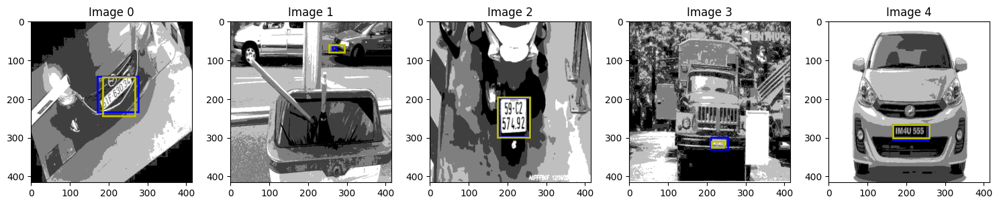

Epoch 350/500 - Loss: 59.813 - Loss Diff: 3.964% - Loss Trend: 3.863 - Complete in: 01:02:10s
Epoch 351/500 - Loss: 68.654 - Loss Diff: 14.783% - Loss Trend: 5.607 - Complete in: 01:01:22s
Epoch 352/500 - Loss: 85.290 - Loss Diff: 24.230% - Loss Trend: 7.389 - Complete in: 01:00:52s
Epoch 353/500 - Loss: 59.905 - Loss Diff: -29.763% - Loss Trend: 5.052 - Complete in: 01:00:29s
Epoch 354/500 - Loss: 61.737 - Loss Diff: 3.059% - Loss Trend: 4.979 - Complete in: 00:59:58s
Epoch 355/500 - Loss: 51.599 - Loss Diff: -16.420% - Loss Trend: -1.544 - Complete in: 00:59:30s
Epoch 356/500 - Loss: 55.261 - Loss Diff: 7.095% - Loss Trend: -5.110 - Complete in: 00:59:07s
Epoch 357/500 - Loss: 53.098 - Loss Diff: -3.913% - Loss Trend: -1.045 - Complete in: 00:58:40s
Epoch 358/500 - Loss: 57.190 - Loss Diff: 7.705% - Loss Trend: 0.496 - Complete in: 00:58:17s
Epoch 359/500 - Loss: 60.358 - Loss Diff: 5.540% - Loss Trend: 0.863 - Complete in: 00:57:48s
Showing 5 images...


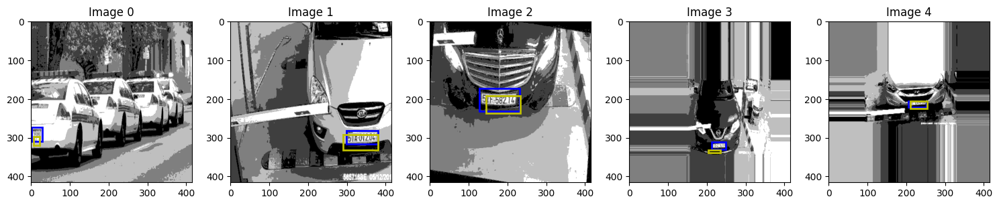

Epoch 360/500 - Loss: 64.006 - Loss Diff: 6.045% - Loss Trend: 1.208 - Complete in: 00:57:58s
Epoch 361/500 - Loss: 55.548 - Loss Diff: -13.215% - Loss Trend: 0.898 - Complete in: 00:57:14s
Epoch 362/500 - Loss: 50.779 - Loss Diff: -8.585% - Loss Trend: 0.135 - Complete in: 00:56:39s
Epoch 363/500 - Loss: 54.068 - Loss Diff: 6.477% - Loss Trend: 0.464 - Complete in: 00:56:14s
Epoch 364/500 - Loss: 56.289 - Loss Diff: 4.108% - Loss Trend: 0.741 - Complete in: 00:55:49s
Epoch 365/500 - Loss: 58.190 - Loss Diff: 3.377% - Loss Trend: 0.701 - Complete in: 00:55:23s
Epoch 366/500 - Loss: 48.759 - Loss Diff: -16.207% - Loss Trend: -1.365 - Complete in: 00:54:58s
Epoch 367/500 - Loss: 51.146 - Loss Diff: 4.895% - Loss Trend: -2.654 - Complete in: 00:54:31s
Epoch 368/500 - Loss: 54.004 - Loss Diff: 5.588% - Loss Trend: -0.297 - Complete in: 00:54:05s
Epoch 369/500 - Loss: 72.744 - Loss Diff: 34.700% - Loss Trend: 1.813 - Complete in: 00:53:46s
Showing 5 images...


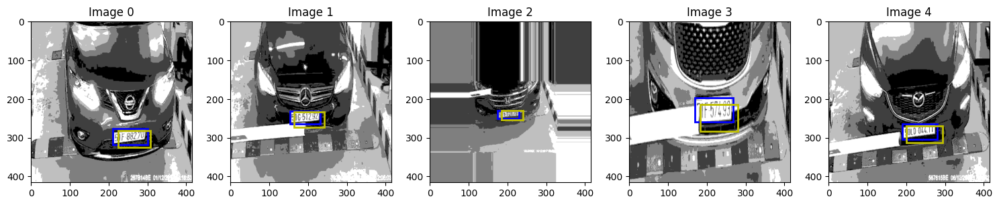

Epoch 370/500 - Loss: 54.577 - Loss Diff: -24.974% - Loss Trend: 1.242 - Complete in: 00:53:54s
Epoch 371/500 - Loss: 61.989 - Loss Diff: 13.581% - Loss Trend: 1.675 - Complete in: 00:53:13s
Epoch 372/500 - Loss: 58.331 - Loss Diff: -5.900% - Loss Trend: 1.542 - Complete in: 00:52:35s
Epoch 373/500 - Loss: 58.087 - Loss Diff: -0.418% - Loss Trend: 1.001 - Complete in: 00:52:06s
Epoch 374/500 - Loss: 59.178 - Loss Diff: 1.878% - Loss Trend: 0.757 - Complete in: 00:51:41s
Epoch 375/500 - Loss: 48.825 - Loss Diff: -17.495% - Loss Trend: -0.813 - Complete in: 00:51:14s
Epoch 376/500 - Loss: 59.061 - Loss Diff: 20.965% - Loss Trend: 1.466 - Complete in: 00:50:52s
Epoch 377/500 - Loss: 51.583 - Loss Diff: -12.661% - Loss Trend: 1.194 - Complete in: 00:50:26s
Epoch 378/500 - Loss: 54.788 - Loss Diff: 6.212% - Loss Trend: 1.177 - Complete in: 00:50:00s
Epoch 379/500 - Loss: 72.928 - Loss Diff: 33.109% - Loss Trend: 3.110 - Complete in: 00:49:33s
Showing 5 images...


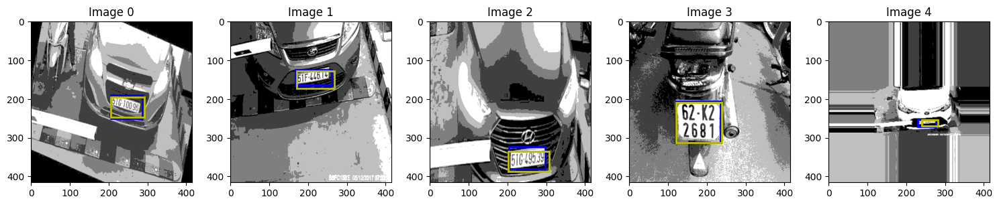

Epoch 380/500 - Loss: 77.031 - Loss Diff: 5.626% - Loss Trend: 3.260 - Complete in: 00:49:39s
Epoch 381/500 - Loss: 82.204 - Loss Diff: 6.715% - Loss Trend: 4.788 - Complete in: 00:48:56s
Epoch 382/500 - Loss: 60.334 - Loss Diff: -26.605% - Loss Trend: 2.688 - Complete in: 00:48:27s
Epoch 383/500 - Loss: 48.814 - Loss Diff: -19.093% - Loss Trend: 1.043 - Complete in: 00:48:00s
Epoch 384/500 - Loss: 49.851 - Loss Diff: 2.124% - Loss Trend: -1.129 - Complete in: 00:47:34s
Epoch 385/500 - Loss: 49.655 - Loss Diff: -0.394% - Loss Trend: 0.510 - Complete in: 00:47:07s
Epoch 386/500 - Loss: 45.032 - Loss Diff: -9.311% - Loss Trend: -1.016 - Complete in: 00:46:37s
Epoch 387/500 - Loss: 42.997 - Loss Diff: -4.518% - Loss Trend: -0.924 - Complete in: 00:46:14s
Epoch 388/500 - Loss: 44.788 - Loss Diff: 4.165% - Loss Trend: -0.619 - Complete in: 00:45:50s
Epoch 389/500 - Loss: 58.302 - Loss Diff: 30.175% - Loss Trend: 1.268 - Complete in: 00:45:24s
Showing 5 images...


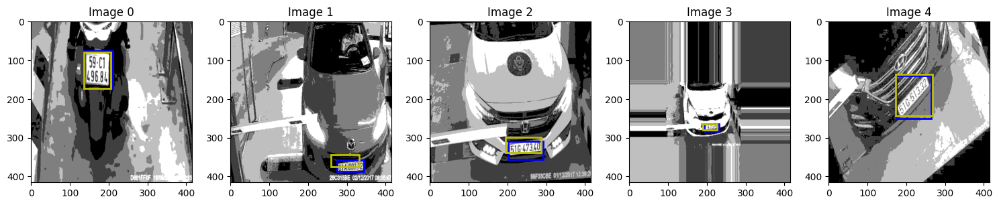

Epoch 390/500 - Loss: 73.349 - Loss Diff: 25.808% - Loss Trend: 4.155 - Complete in: 00:45:29s
Epoch 391/500 - Loss: 54.277 - Loss Diff: -26.002% - Loss Trend: 1.023 - Complete in: 00:44:54s
Epoch 392/500 - Loss: 46.753 - Loss Diff: -13.863% - Loss Trend: 0.943 - Complete in: 00:44:23s
Epoch 393/500 - Loss: 45.700 - Loss Diff: -2.251% - Loss Trend: 0.379 - Complete in: 00:43:59s
Epoch 394/500 - Loss: 49.790 - Loss Diff: 8.949% - Loss Trend: -1.232 - Complete in: 00:43:26s
Epoch 395/500 - Loss: 54.940 - Loss Diff: 10.344% - Loss Trend: -0.917 - Complete in: 00:43:03s
Epoch 396/500 - Loss: 44.177 - Loss Diff: -19.591% - Loss Trend: -2.671 - Complete in: 00:42:42s
Epoch 397/500 - Loss: 43.838 - Loss Diff: -0.767% - Loss Trend: -0.948 - Complete in: 00:42:13s
Epoch 398/500 - Loss: 46.671 - Loss Diff: 6.462% - Loss Trend: 0.755 - Complete in: 00:41:46s
Epoch 399/500 - Loss: 43.140 - Loss Diff: -7.565% - Loss Trend: 0.109 - Complete in: 00:41:21s
Showing 5 images...


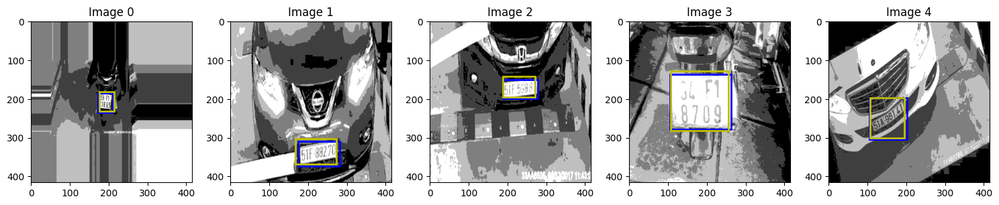

Epoch 400/500 - Loss: 51.497 - Loss Diff: 19.372% - Loss Trend: 1.427 - Complete in: 00:41:26s
Epoch 401/500 - Loss: 51.624 - Loss Diff: 0.247% - Loss Trend: 2.064 - Complete in: 00:40:46s
Epoch 402/500 - Loss: 45.693 - Loss Diff: -11.489% - Loss Trend: 1.600 - Complete in: 00:40:15s
Epoch 403/500 - Loss: 47.466 - Loss Diff: 3.881% - Loss Trend: 1.581 - Complete in: 00:39:47s
Epoch 404/500 - Loss: 42.244 - Loss Diff: -11.003% - Loss Trend: -1.165 - Complete in: 00:39:18s
Epoch 405/500 - Loss: 42.682 - Loss Diff: 1.038% - Loss Trend: -2.816 - Complete in: 00:38:54s
Epoch 406/500 - Loss: 42.637 - Loss Diff: -0.107% - Loss Trend: -1.090 - Complete in: 00:38:25s
Epoch 407/500 - Loss: 41.846 - Loss Diff: -1.855% - Loss Trend: -0.289 - Complete in: 00:38:01s
Epoch 408/500 - Loss: 39.569 - Loss Diff: -5.440% - Loss Trend: -0.502 - Complete in: 00:37:34s
Epoch 409/500 - Loss: 49.551 - Loss Diff: 25.225% - Loss Trend: 0.583 - Complete in: 00:37:08s
Showing 5 images...


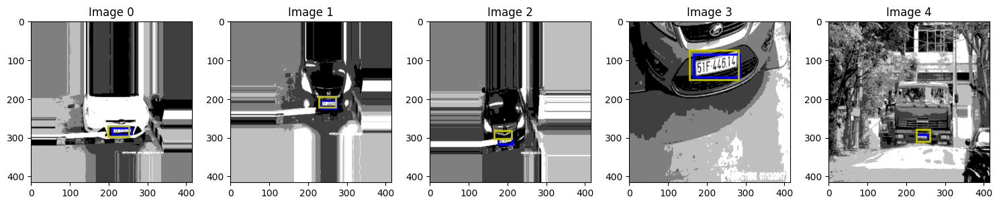

Epoch 410/500 - Loss: 76.842 - Loss Diff: 55.077% - Loss Trend: 3.566 - Complete in: 00:37:13s
Epoch 411/500 - Loss: 58.665 - Loss Diff: -23.655% - Loss Trend: 3.295 - Complete in: 00:36:36s
Epoch 412/500 - Loss: 54.728 - Loss Diff: -6.711% - Loss Trend: 2.899 - Complete in: 00:36:06s
Epoch 413/500 - Loss: 57.400 - Loss Diff: 4.882% - Loss Trend: 2.793 - Complete in: 00:35:36s
Epoch 414/500 - Loss: 68.554 - Loss Diff: 19.432% - Loss Trend: 4.593 - Complete in: 00:35:09s
Epoch 415/500 - Loss: 37.374 - Loss Diff: -45.482% - Loss Trend: 0.269 - Complete in: 00:34:43s
Epoch 416/500 - Loss: 40.629 - Loss Diff: 8.709% - Loss Trend: 0.834 - Complete in: 00:34:20s
Epoch 417/500 - Loss: 35.235 - Loss Diff: -13.277% - Loss Trend: 0.714 - Complete in: 00:33:54s
Epoch 418/500 - Loss: 38.556 - Loss Diff: 9.423% - Loss Trend: 1.084 - Complete in: 00:33:29s
Epoch 419/500 - Loss: 35.275 - Loss Diff: -8.508% - Loss Trend: 1.250 - Complete in: 00:33:04s
Showing 5 images...


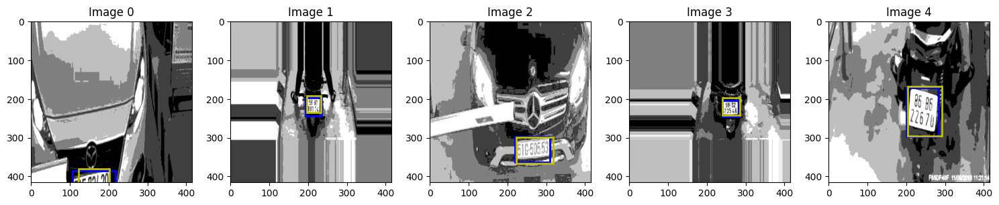

Epoch 420/500 - Loss: 38.751 - Loss Diff: 9.853% - Loss Trend: 1.838 - Complete in: 00:33:03s
Epoch 421/500 - Loss: 38.110 - Loss Diff: -1.654% - Loss Trend: 1.735 - Complete in: 00:32:25s
Epoch 422/500 - Loss: 46.012 - Loss Diff: 20.735% - Loss Trend: 3.241 - Complete in: 00:31:53s
Epoch 423/500 - Loss: 50.966 - Loss Diff: 10.766% - Loss Trend: 4.321 - Complete in: 00:31:26s
Epoch 424/500 - Loss: 49.135 - Loss Diff: -3.593% - Loss Trend: 2.400 - Complete in: 00:31:01s
Epoch 425/500 - Loss: 37.425 - Loss Diff: -23.832% - Loss Trend: -2.861 - Complete in: 00:30:37s
Epoch 426/500 - Loss: 33.886 - Loss Diff: -9.456% - Loss Trend: -1.914 - Complete in: 00:30:12s
Epoch 427/500 - Loss: 39.461 - Loss Diff: 16.453% - Loss Trend: -0.370 - Complete in: 00:29:46s
Epoch 428/500 - Loss: 39.411 - Loss Diff: -0.127% - Loss Trend: -0.704 - Complete in: 00:29:22s
Epoch 429/500 - Loss: 35.465 - Loss Diff: -10.012% - Loss Trend: -2.667 - Complete in: 00:28:56s
Showing 5 images...


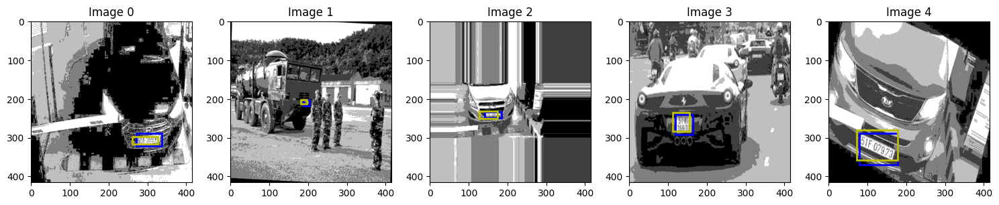

Epoch 430/500 - Loss: 54.700 - Loss Diff: 54.234% - Loss Trend: 3.981 - Complete in: 00:28:51s
Epoch 431/500 - Loss: 41.937 - Loss Diff: -23.333% - Loss Trend: 1.845 - Complete in: 00:28:15s
Epoch 432/500 - Loss: 52.242 - Loss Diff: 24.575% - Loss Trend: 4.368 - Complete in: 00:27:44s
Epoch 433/500 - Loss: 47.753 - Loss Diff: -8.593% - Loss Trend: 3.167 - Complete in: 00:27:16s
Epoch 434/500 - Loss: 40.991 - Loss Diff: -14.161% - Loss Trend: 2.790 - Complete in: 00:26:52s
Epoch 435/500 - Loss: 40.259 - Loss Diff: -1.786% - Loss Trend: 2.014 - Complete in: 00:26:28s
Epoch 436/500 - Loss: 35.068 - Loss Diff: -12.892% - Loss Trend: 1.265 - Complete in: 00:26:03s
Epoch 437/500 - Loss: 39.142 - Loss Diff: 11.615% - Loss Trend: 0.657 - Complete in: 00:25:38s
Epoch 438/500 - Loss: 37.098 - Loss Diff: -5.220% - Loss Trend: -0.409 - Complete in: 00:25:16s
Epoch 439/500 - Loss: 33.938 - Loss Diff: -8.519% - Loss Trend: -0.737 - Complete in: 00:24:49s
Showing 5 images...


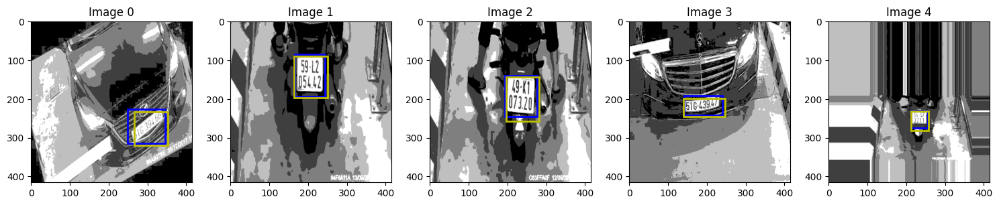

Epoch 440/500 - Loss: 48.366 - Loss Diff: 42.514% - Loss Trend: 3.686 - Complete in: 00:24:40s
Epoch 441/500 - Loss: 39.731 - Loss Diff: -17.853% - Loss Trend: 3.126 - Complete in: 00:24:06s
Epoch 442/500 - Loss: 55.932 - Loss Diff: 40.776% - Loss Trend: 4.748 - Complete in: 00:23:36s
Epoch 443/500 - Loss: 36.512 - Loss Diff: -34.721% - Loss Trend: 2.442 - Complete in: 00:23:09s
Epoch 444/500 - Loss: 38.216 - Loss Diff: 4.666% - Loss Trend: 3.420 - Complete in: 00:22:45s
Epoch 445/500 - Loss: 40.754 - Loss Diff: 6.643% - Loss Trend: 0.247 - Complete in: 00:22:19s
Epoch 446/500 - Loss: 41.519 - Loss Diff: 1.876% - Loss Trend: 1.928 - Complete in: 00:21:53s
Epoch 447/500 - Loss: 55.324 - Loss Diff: 33.251% - Loss Trend: 2.506 - Complete in: 00:21:27s
Epoch 448/500 - Loss: 49.135 - Loss Diff: -11.187% - Loss Trend: 2.333 - Complete in: 00:21:03s
Epoch 449/500 - Loss: 45.262 - Loss Diff: -7.882% - Loss Trend: 2.752 - Complete in: 00:20:37s
Showing 5 images...


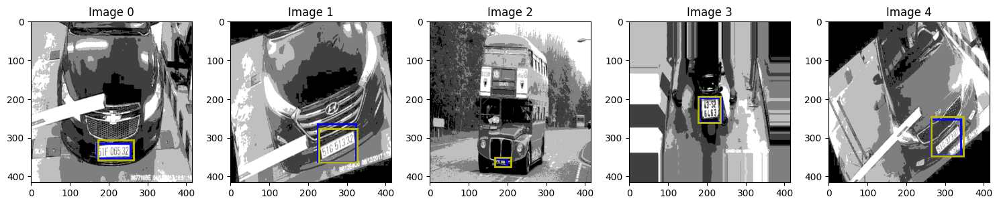

Epoch 450/500 - Loss: 47.465 - Loss Diff: 4.867% - Loss Trend: 3.196 - Complete in: 00:20:28s
Epoch 451/500 - Loss: 35.778 - Loss Diff: -24.623% - Loss Trend: 2.414 - Complete in: 00:19:58s
Epoch 452/500 - Loss: 38.185 - Loss Diff: 6.728% - Loss Trend: 2.088 - Complete in: 00:19:28s
Epoch 453/500 - Loss: 50.689 - Loss Diff: 32.748% - Loss Trend: 4.619 - Complete in: 00:19:01s
Epoch 454/500 - Loss: 48.089 - Loss Diff: -5.129% - Loss Trend: 4.845 - Complete in: 00:18:37s
Epoch 455/500 - Loss: 32.307 - Loss Diff: -32.819% - Loss Trend: -0.177 - Complete in: 00:18:11s
Epoch 456/500 - Loss: 31.861 - Loss Diff: -1.379% - Loss Trend: 0.921 - Complete in: 00:17:47s
Epoch 457/500 - Loss: 62.823 - Loss Diff: 97.176% - Loss Trend: 4.681 - Complete in: 00:17:20s
Epoch 458/500 - Loss: 42.403 - Loss Diff: -32.505% - Loss Trend: 4.829 - Complete in: 00:16:56s
Epoch 459/500 - Loss: 45.434 - Loss Diff: 7.148% - Loss Trend: 4.994 - Complete in: 00:16:35s
Showing 5 images...


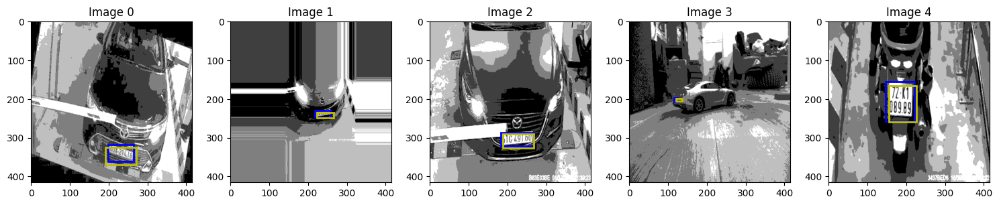

Epoch 460/500 - Loss: 42.532 - Loss Diff: -6.386% - Loss Trend: 4.126 - Complete in: 00:16:24s
Epoch 461/500 - Loss: 34.307 - Loss Diff: -19.339% - Loss Trend: 2.711 - Complete in: 00:15:51s
Epoch 462/500 - Loss: 33.968 - Loss Diff: -0.989% - Loss Trend: 0.429 - Complete in: 00:15:22s
Epoch 463/500 - Loss: 37.000 - Loss Diff: 8.928% - Loss Trend: 1.770 - Complete in: 00:14:54s
Epoch 464/500 - Loss: 31.572 - Loss Diff: -14.672% - Loss Trend: 1.317 - Complete in: 00:14:27s
Epoch 465/500 - Loss: 27.375 - Loss Diff: -13.294% - Loss Trend: 0.106 - Complete in: 00:14:02s
Epoch 466/500 - Loss: 35.668 - Loss Diff: 30.296% - Loss Trend: 3.768 - Complete in: 00:13:38s
Epoch 467/500 - Loss: 27.063 - Loss Diff: -24.125% - Loss Trend: 1.711 - Complete in: 00:13:13s
Epoch 468/500 - Loss: 28.587 - Loss Diff: 5.631% - Loss Trend: -0.097 - Complete in: 00:12:47s
Epoch 469/500 - Loss: 30.310 - Loss Diff: 6.027% - Loss Trend: 0.647 - Complete in: 00:12:23s
Showing 5 images...


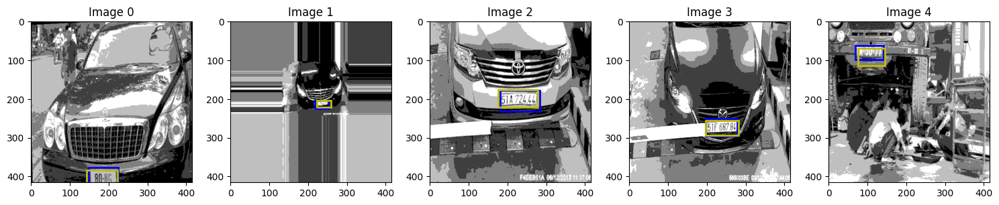

Epoch 470/500 - Loss: 28.275 - Loss Diff: -6.714% - Loss Trend: 2.387 - Complete in: 00:12:09s
Epoch 471/500 - Loss: 43.462 - Loss Diff: 53.711% - Loss Trend: 6.060 - Complete in: 00:11:39s
Epoch 472/500 - Loss: 33.446 - Loss Diff: -23.045% - Loss Trend: -1.955 - Complete in: 00:11:12s
Epoch 473/500 - Loss: 38.978 - Loss Diff: 16.540% - Loss Trend: 1.315 - Complete in: 00:10:46s
Epoch 474/500 - Loss: 36.675 - Loss Diff: -5.910% - Loss Trend: 0.444 - Complete in: 00:10:21s
Epoch 475/500 - Loss: 29.086 - Loss Diff: -20.692% - Loss Trend: -0.510 - Complete in: 00:09:56s
Epoch 476/500 - Loss: 34.550 - Loss Diff: 18.788% - Loss Trend: 2.032 - Complete in: 00:09:30s
Epoch 477/500 - Loss: 28.470 - Loss Diff: -17.599% - Loss Trend: 0.925 - Complete in: 00:09:05s
Epoch 478/500 - Loss: 41.524 - Loss Diff: 45.854% - Loss Trend: 3.386 - Complete in: 00:08:40s
Epoch 479/500 - Loss: 28.900 - Loss Diff: -30.402% - Loss Trend: 2.338 - Complete in: 00:08:15s
Showing 5 images...


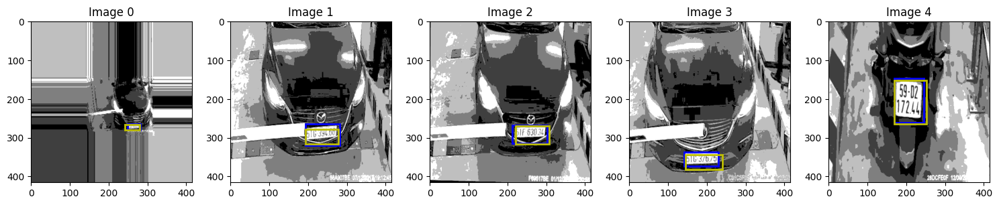

Epoch 480/500 - Loss: 30.013 - Loss Diff: 3.851% - Loss Trend: 3.481 - Complete in: 00:07:56s
Epoch 481/500 - Loss: 29.256 - Loss Diff: -2.521% - Loss Trend: 1.293 - Complete in: 00:07:28s
Epoch 482/500 - Loss: 25.091 - Loss Diff: -14.239% - Loss Trend: 1.952 - Complete in: 00:07:02s
Epoch 483/500 - Loss: 30.332 - Loss Diff: 20.889% - Loss Trend: 2.969 - Complete in: 00:06:37s
Epoch 484/500 - Loss: 26.966 - Loss Diff: -11.098% - Loss Trend: 1.828 - Complete in: 00:06:12s
Epoch 485/500 - Loss: 29.385 - Loss Diff: 8.971% - Loss Trend: 2.873 - Complete in: 00:05:47s
Epoch 486/500 - Loss: 33.482 - Loss Diff: 13.944% - Loss Trend: 0.222 - Complete in: 00:05:22s
Epoch 487/500 - Loss: 27.950 - Loss Diff: -16.522% - Loss Trend: 0.657 - Complete in: 00:04:57s
Epoch 488/500 - Loss: 38.765 - Loss Diff: 38.695% - Loss Trend: 2.134 - Complete in: 00:04:32s
Epoch 489/500 - Loss: 36.982 - Loss Diff: -4.601% - Loss Trend: 2.221 - Complete in: 00:04:07s
Showing 5 images...


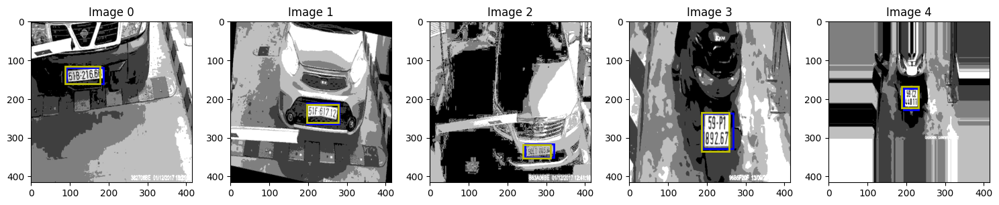

Epoch 490/500 - Loss: 35.879 - Loss Diff: -2.981% - Loss Trend: 3.402 - Complete in: 00:03:45s
Epoch 491/500 - Loss: 83.255 - Loss Diff: 132.040% - Loss Trend: 10.952 - Complete in: 00:03:19s
Epoch 492/500 - Loss: 48.383 - Loss Diff: -41.885% - Loss Trend: 9.333 - Complete in: 00:02:54s
Epoch 493/500 - Loss: 41.005 - Loss Diff: -15.249% - Loss Trend: 5.260 - Complete in: 00:02:29s
Epoch 494/500 - Loss: 30.957 - Loss Diff: -24.506% - Loss Trend: 5.653 - Complete in: 00:02:04s
Epoch 495/500 - Loss: 36.676 - Loss Diff: 18.475% - Loss Trend: 6.628 - Complete in: 00:01:39s
Epoch 496/500 - Loss: 30.738 - Loss Diff: -16.191% - Loss Trend: 5.716 - Complete in: 00:01:14s
Epoch 497/500 - Loss: 28.367 - Loss Diff: -7.714% - Loss Trend: 6.151 - Complete in: 00:00:49s
Epoch 498/500 - Loss: 30.339 - Loss Diff: 6.951% - Loss Trend: 5.222 - Complete in: 00:00:24s
Epoch 499/500 - Loss: 33.605 - Loss Diff: 10.766% - Loss Trend: 6.680 - Complete in: 00:00:00s
Total training time: 12431.00 seconds


In [13]:
# Training Loop
import time
from jupyterplot import ProgressPlot
import cv2

class StatsManager():
    def __init__(self, epoch_count):
        self.avg_epoch_duration = None
        self.start_loss_plot = 2
        self.last_loss = []
        self.loss_simple = 1
        self.loss_pc_history = []
        self.cumulative_loss = torch.zeros(1, device=device)
        self.batch_count = 0
        self.final_epoch = 0
        self.epoch_count = epoch_count

        self.pp = ProgressPlot(
            plot_names=["Training Loss over Epochs"],
            line_names=["loss"],
            x_label="Epochs",
        )
    
    def start_train(self):

        print(f"The loss plot will start from Epoch #{self.start_loss_plot} onwards, to enhance readability.")
        print("Waiting 2s before starting training...")
        time.sleep(2)

        self.start_time = time.time()

    def finish_epoch(self, epoch_num, duration, loss):

        # Update graph
        if len(self.loss_pc_history) >= self.start_loss_plot:
            self.pp.update(loss)

        # Time estimation
        self.avg_epoch_duration = duration if epoch_num == 0 else (self.avg_epoch_duration + duration) / 2
        completion_time = seconds_to_hms((self.epoch_count - epoch_num - 1) * self.avg_epoch_duration)
        self.final_epoch = epoch_num

        # Loss calculations
        if len(self.last_loss) > 0:
            loss_diff = -(100 - (loss / self.last_loss[-1] * 100))
        else:
            loss_diff = 0
        self.last_loss.append(loss)
        self.loss_pc_history.append(loss_diff)
        avg_loss_trend = sum(self.loss_pc_history[-15:]) / 15 if len(self.loss_pc_history) >= 15 else sum(self.loss_pc_history) / len(self.loss_pc_history)

        print(f"Epoch {str(epoch_num).rjust(3)}/{self.epoch_count} - Loss: {loss:.3f} - Loss Diff: {loss_diff:.3f}% - Loss Trend: {avg_loss_trend:.3f} - Complete in: {completion_time}s")
    
    def finalise(self):
        # Training completion
        print("Total training time: {:.2f} seconds".format(time.time() - self.start_time))
        self.pp.finalize()


# Function for a single training epoch
def train_epoch(model, data_loader, loss_function, optimizer, device, demo=False):
    model.train()
    cumulative_loss = torch.zeros(1, device=device)
    bacth_size = 0

    if demo:
        demo_arr = []

    for batch_idx, (inputs, targets) in enumerate(data_loader):
        inputs, targets = inputs.to(device), targets.to(device)
        
        # Forward pass
        predictions = model(inputs)
        
        # Calculate loss
        loss = loss_function(predictions, targets)
        
        # Backward pass and optimize
        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        optimizer.step()

        if demo:
            for i in range(5):
                demo_arr.append(("Image " + str(i), inputs[i].detach(), targets[i].detach(), predictions[i].detach()))
            show_imgs(demo_arr)
            demo = False
        
        cumulative_loss += loss
        batch_size = batch_idx
    
    return (cumulative_loss / batch_size).item()

# Training loop
def train_model(model, data_loader, device, epochs):

    stats = StatsManager(epochs)

    # Define the loss function and optimizer
    loss_function = torch.nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)

    print("Running", model.__class__.__name__ ,"on", device)

    stats.start_train()

    for epoch in range(epochs):
        epoch_start_time = time.time()
        avg_loss = train_epoch(model, data_loader, loss_function, optimizer, device, epoch % 10 == 0)
        epoch_end_time = time.time()

        stats.finish_epoch(epoch, epoch_end_time - epoch_start_time, avg_loss)
    
    stats.finalise()

    return stats

torch.cuda.empty_cache()

# Instantiate the model and move it to the configured device
model = LPLocalNet().to(device)

# Start the training process
train_loader = DataLoader(dataset.training_data, batch_size=BATCH_SIZE, shuffle=True)

# Start the training process
stats = train_model(model, train_loader, device, EPOCHS)



In [14]:
torch.cuda.empty_cache()

# Evaluation and Testing

100%|██████████| 869/869 [00:03<00:00, 248.99it/s]


Accuracy: 74.799%
Showing 5 images...


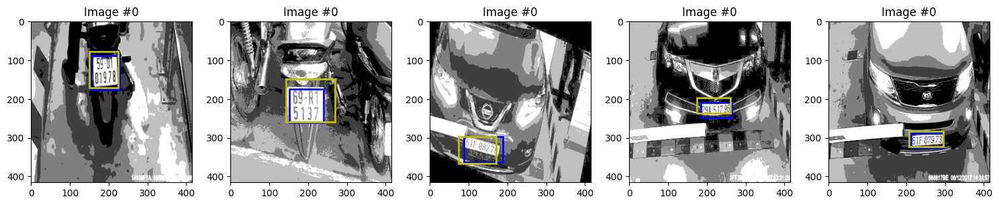

In [15]:
# Evaluation and Testing

# Constants
ACCEPTABLE_DISTANCE = 15

# Function to check if two numbers are within an acceptable distance
def close_enough(num1, num2):
    return abs(num1 - num2) < ACCEPTABLE_DISTANCE

# Function to test the network with DataLoader
def test_network(model, data_loader):
    correct = 0
    total = 0
    demo_arr = []
    
    model.eval()
    with torch.no_grad():
        for batch in tqdm(data_loader):
            images, real_bboxes = batch
            images = images.to(device)
            real_bboxes = real_bboxes.to(device)
            predicted_bboxes = model(images)

            # Compare predicted and real bounding boxes
            for i in range(len(real_bboxes)):
                if all(close_enough(pred, real) for pred, real in zip(predicted_bboxes[i], real_bboxes[i])):
                    correct += 1
                if len(demo_arr) < 5:
                    demo_arr.append(["Image #{}".format(i), images[i], real_bboxes[i], predicted_bboxes[i]])
                total += 1

    accuracy = correct / total
    return accuracy, demo_arr

# Prepare the test loader
test_loader = DataLoader(dataset.testing_data, batch_size=1, shuffle=True)

# Test the network
accuracy, demo_arr = test_network(model, test_loader)
print(f"Accuracy: {accuracy * 100:.3f}%")
show_imgs(demo_arr)

# Clear GPU cache
torch.cuda.empty_cache()

# Inference Pipeline

In [ ]:

# Inference Pipeline

def inference_pipeline(image_path, model, device, mean, std):
    # Preprocess the image
    image = read_image(image_path)
    image_tensor = resize_and_normalize_image(image, mean, std)
    
    # Add an extra batch dimension since pytorch treats all inputs as batches
    image_tensor = image_tensor.unsqueeze(0).to(device)
    
    # Forward pass, get the model's prediction
    model.eval()
    with torch.no_grad():
        predictions = model(image_tensor)
    
    # Post-process the predictions to get the final bounding box (if necessary)
    bounding_box = postprocess_predictions(predictions)
    
    return bounding_box

def postprocess_predictions(predictions):
    # Placeholder for post-processing code
    # Convert the predictions into a bounding box or other desired format
    return predictions


# Model Saving

In [17]:

# Model Saving

def save_model(model, network_name, batch_size, epochs, learning_rate, accuracy):
    """
    Save the PyTorch model with a filename constructed from training parameters.

    Parameters:
    - model: The PyTorch model to save
    - network_name: Name of the neural network architecture (e.g., "ResNet50")
    - batch_size: Batch size used during training
    - epochs: Number of epochs for training
    - learning_rate: Learning rate used during training
    - accuracy: Final accuracy of the model

    Returns:
    - filename: The path to the saved model
    """
    # Construct the filename
    filename = f"{network_name}_B{batch_size}_E{epochs}_LR{learning_rate:.4f}_Acc{accuracy:.2f}.pth"
    
    # Save the model
    torch.save(model.state_dict(), os.path.join("models/checkpoints/", filename))
    
    return filename

def save_model_stats(model, so):
    save_model(model, model.__class__.__name__, BATCH_SIZE, so.final_epoch + 1, LEARNING_RATE, so.last_loss[-1])

# Save the model to a file
save_model_stats(model, stats)
